In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import pickle
import pynbody
pynbody.config['halo-class-priority'] =  [pynbody.halo.ahf.AHFCatalogue,
                                          pynbody.halo.GrpCatalogue,
                                          pynbody.halo.AmigaGrpCatalogue,
                                          pynbody.halo.legacy.RockstarIntermediateCatalogue,
                                          pynbody.halo.rockstar.RockstarCatalogue,
                                          pynbody.halo.subfind.SubfindCatalogue, pynbody.halo.hop.HOPCatalogue]

%matplotlib inline
print(mpl.get_backend())
mpl.rc('font',**{'family':'serif','monospace':['Palatino']})
mpl.rc('text', usetex=True)
mpl.rcParams.update({'font.size': 9})

module://ipykernel.pylab.backend_inline


In [53]:
def read_file(name, halo_num):
    data = []
    with open('/home/akinshol/Data/Timescales/DataFiles/'+name+'.data','rb') as f:
        while True:
            try: 
                data.append(pickle.load(f))
            except EOFError:
                break
    data = pd.DataFrame(data)
    
    if not halo_num=='all':
        data = data[data.z0haloid == halo_num]

    return data

def cumulative_sfh(name, halo_num):
    age = 13.800797497330507
    if name=='h148':
        s = pynbody.load('/home/christenc/Data/Sims/h148.cosmo50PLK.3072g/h148.cosmo50PLK.3072g3HbwK1BH/snapshots_200bkgdens/h148.cosmo50PLK.3072g3HbwK1BH.004096')
    else:
        s = pynbody.load('/home/christenc/Data/Sims/'+name+'.cosmo50PLK.3072g/'+name+'.cosmo50PLK.3072gst5HbwK1BH/snapshots_200bkgdens/'+name+'.cosmo50PLK.3072gst5HbwK1BH.004096')
    halo = s.halos()[halo_num]
    try:
        sfh, bins = pynbody.plot.stars.sfh(halo, filename=None, massform=False, clear=False, legend=False, subplot=False, trange=False, bins=128)
        plt.clf()
    except ValueError:
        print(f'Cannot create SFH, only {len(halo.s)} star particles')
        raise

    sfhmstar = np.sum(sfh)
    bincenters = 0.5*(bins[1:]+bins[:-1])
    c_sfh = np.empty(shape=sfh.shape)
    for i in range(len(bincenters)):
        c_sfh[i] = np.sum(sfh[:i+1])/sfhmstar 
    return c_sfh, age-bincenters


In [213]:
def CaseStudyPlots(simulation_name,i,filename=True, ret = False):

    data = read_file(simulation_name, i)
    # data[:10]

    age = 13.800797497330507
    q_thresh = 0.9
    i_thresh = 1.0
    
    print('Gathering data...')
    time = age - np.array(data['time'], dtype=float)
    gasfrac = np.array(data['gasfrac'], dtype=float)
    gastemp = np.array(data['gtemp'], dtype=float)
    ratio = np.array(data['ratio'], dtype=float)
    dist = np.array(data['h1dist'], dtype=float)
    SNHf = np.array(data['SNHfrac'], dtype=float)
    fHI = np.array(data['fHI'], dtype=float)
    mvir = np.array(data['mass'], dtype=float)
    HIratio = np.array(data['HIratio'], dtype=float)
    mHI = np.array(data['HIratio'],dtype=float)*np.array(data['mstar'],dtype=float)
    mgas = np.array(data['mgas'],dtype=float)
    c_sfh, bc = cumulative_sfh(simulation_name, i)

    shaded_min = -1
    shaded_max = 500*np.max(mgas)

    fig, ax = plt.subplots(1,4,figsize=(24,4),dpi=300)
    
    ax[3].plot(time,dist,'g-')
    ax[3].invert_xaxis()
    ax[3].set_xlabel('Lookback Time [Gyr]')
    label3 = ax[3].set_ylabel(r'Distance from Host [$R_{\mathrm{vir}}$]')
    label3.set_color('g')
    ax[3].semilogy()
    ax[3].set_xlim(14,0)
    ax[3].set_ylim(0.1, 25)

    ax1 = ax[3].twinx()
    ax1.plot(time,ratio,'m-')
    label4 = ax1.set_ylabel(r'$P_{\mathrm{ram}} / P_{\mathrm{rest}}$')
    label4.set_color('m')
    try:
        ax1.set_ylim(np.min(ratio[~np.isnan(ratio)])-0.3, np.max(ratio[~np.isnan(ratio)])+1)
    except:
        ax1.set_ylim(0., 10)
    npeaks = 1
    peak_indices = np.argsort(ratio[~np.isnan(ratio)])[-npeaks:]


    ax[3].fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')

    for index in peak_indices:
        t = time[~np.isnan(ratio)][index]
        ax[3].plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)

    
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')

    for i in [0,1,2]:
        for index in peak_indices:
            t = time[~np.isnan(ratio)][index]
            ax[i].plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)


    ax[0].plot(bc, c_sfh, 'r-')
    ax[0].invert_xaxis()
    ax[0].set_xlabel('Lookback Time [Gyr]')
    label1 = ax[0].set_ylabel('Cumulative, Normalized SFH')
    label1.set_color('r')
    ax[0].set_ylim(-0.05,1.05)
    ax[0].set_xlim(14,0)

    ax0 = ax[0].twinx()
    ax0.plot(time,HIratio,'b-')
    ax0.set_ylim(-1,10)
    label2 = ax0.set_ylabel(r'$M_{\mathrm{HI}}\ /\ M_{*}$')
    label2.set_color('b')
    t = np.max(bc[c_sfh >= 0.99])

    for i in [0,1,2]:
        ax[i].plot([t,t],[shaded_min,shaded_max], 'r--', linewidth=1)


    ax[1].plot(time,mHI,color='#370ec2',label='HI', linestyle='-')
    ax[1].plot(time,mgas,color='#370ec2',label='All Gas', linestyle='--')
    ax[1].set_xlabel('Lookback Time [Gyr]')
    label = ax[1].set_ylabel(r'Gas Mass [$M_{\odot}$]')
    label.set_color('#370ec2')
    ax[1].legend(frameon=False)
    ax[1].semilogy()
    ax[1].invert_xaxis()
    ax[1].set_xlim(14,0)
    allgas = np.append(mgas,mHI)
    allgas = allgas[(~np.isnan(allgas)) & (allgas!=0)]
    ax[1].set_ylim(0.5*np.min(allgas),1.4*np.max(allgas))

    ax1 = ax[1].twinx()
    ax1.plot(time,gastemp,'k-')
    ax1.invert_xaxis()
    ax1.set_xlabel('Lookback Time [Gyr]')
    ax1.set_ylabel('Mean Gas Temperature [K]')
    ax1.set_xlim(14,0)
    ax1.set_ylim(0.85*np.min(gastemp[~np.isnan(gastemp)]), 1.05*np.max(gastemp[~np.isnan(gastemp)]))

    # ax[2].set_ylim(0.85*np.min(gastemp[~np.isnan(gastemp)]), 1.4*np.max(gastemp[~np.isnan(gastemp)]))
    # ax[2].plot(time,data['outflow_temp_23'],label='Outflow')
    # ax[2].plot(time,data['inflow_temp_23'],label='Inflow')
    # ax[2].legend(frameon=False, prop={'size':9})
    # ax[2].semilogy()


    netflux = data['outflow_91'] + data['inflow_91']
    # ax[2].plot(time, netflux, color='#ad7617', linestyle='-')
    # ax[2].invert_xaxis()
    # label5 = ax[2].set_ylabel(r'Net Gas Flux [$M_{\mathrm{\odot}}\ \mathrm{yr}^{-1}$]')
    # label5.set_color('#ad7617')
    # ax[2].set_ylim(1.2*np.min(netflux),1.2*np.max(netflux))
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min,shaded_max, where=(netflux < 0.), edgecolor='none',alpha=0.2, facecolor='#ad7617')

    ax[2].invert_xaxis()
    ax[2].plot(time,abs(data['outflow_91']), color='r',label='outflow')
    ax[2].plot(time,abs(data['inflow_91']), color='orange', label='inflow')
    ax[2].set_ylabel('Outflow Rate / Inflow Rate')
    ax[2].legend(frameon=False)
    alloutflows = np.append(abs(data['outflow_91']),abs(data['inflow_91']))
    alloutflows = alloutflows[~np.isnan(alloutflows)]

    if (alloutflows == 0.).all():
        ax[2].set_ylim(-0.001,0.001)
    else:
        ax[2].set_ylim(-0.001,1.3*np.max(alloutflows))
    ax[2].set_xlim(14,0)

    ax2 = ax[2].twinx()
    
    gas_rho = np.array(data.gas_rho)
    gas_temp = np.array(data.gas_temp)
    gas_mass =np.array(data.gas_mass)
    
    frac_SF = np.array([],dtype=float)
    for i in range(len(data)):
        gm = np.array(gas_mass[i])
        gr = np.array(gas_rho[i])
        #gt = np.array(gas_temp[i])
        if len(gm[gr> 2.4e6])>0:
            m = np.sum(gm[gr > 2.4e6]) / np.sum(gm)
        else:
            m = 0
        frac_SF = np.append(frac_SF, m)
    
    ax2.plot(time, frac_SF , c='b')
    ax2.set_ylim(-0.05,1.05)
    label = ax2.set_ylabel('Dense Gas Fraction')
    label.set_color('b')


    plt.subplots_adjust(wspace=0.45)
    if filename:
        f = 'case_study_'+str(simulation_name)+'_'+str(i)+'.png'
        plt.savefig('CaseStudyPlots/'+f, dpi=300)
    else:
        plt.savefig('CaseStudyPlots/'+str(filename), dpi=300)
    plt.show()
    
    if ret:
        return t, time, gasfrac
    

In [210]:
ids = [13, 28, 32, 37, 45, 48, 68, 127, 163, 278, 283, 329, 24, 41, 80, 439, 20, 22, 23, 55, 31, 33]
sims = ['h148', 'h148', 'h148', 'h148', 'h148', 'h148', 'h148', 'h148', 'h148', 'h148', 'h148', 'h148', 'h242', 'h242', 'h242', 'h242', 'h229', 'h229', 'h229', 'h229', 'h329', 'h329']

h148-13
Gathering data...


<Figure size 432x288 with 0 Axes>

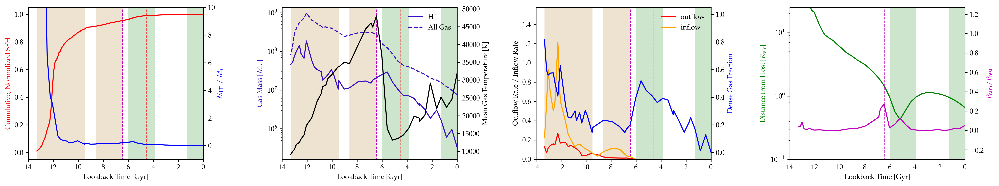

Tquench: 4.58, Tgasloss: 0.43, diff: 4.14
h148-28
Gathering data...


<Figure size 432x288 with 0 Axes>

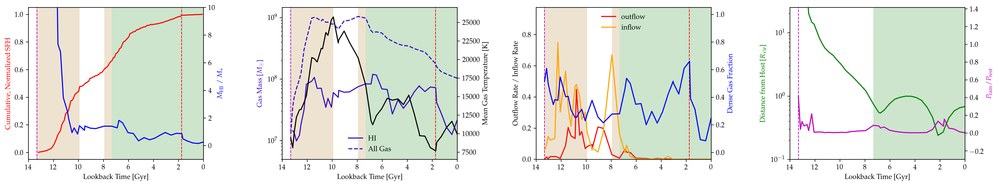

Hasnt lost its gas yet
Tquench: 1.74, Tgasloss: 0.00, diff: 1.74
h148-32
Gathering data...


<Figure size 432x288 with 0 Axes>

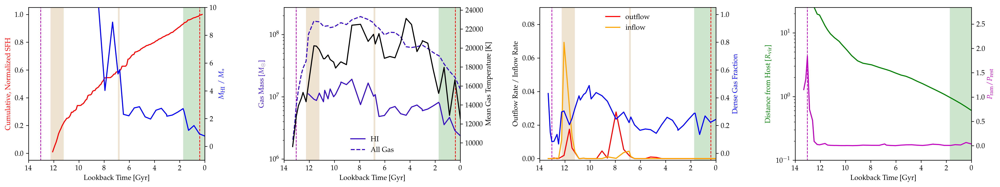

Hasnt lost its gas yet
Tquench: 0.40, Tgasloss: 0.00, diff: 0.40
h148-37
Gathering data...


<Figure size 432x288 with 0 Axes>

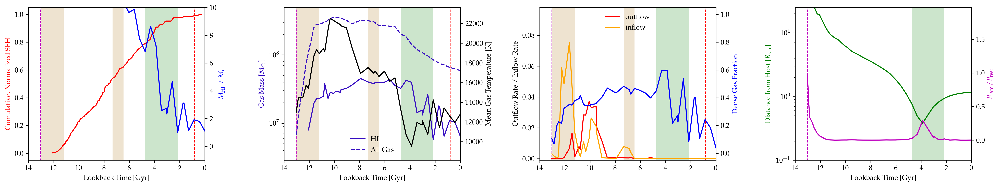

Hasnt lost its gas yet
Tquench: 0.81, Tgasloss: 0.00, diff: 0.81
h148-45
Gathering data...


<Figure size 432x288 with 0 Axes>

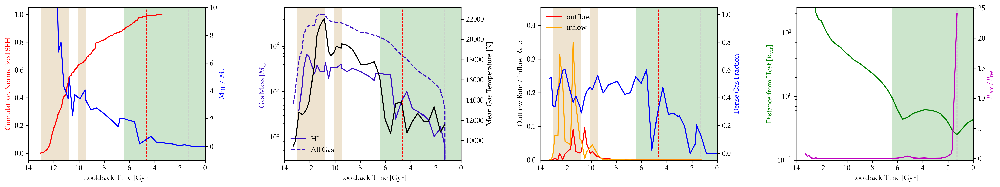

Tquench: 4.65, Tgasloss: 0.86, diff: 3.79
h148-48
Gathering data...


<Figure size 432x288 with 0 Axes>

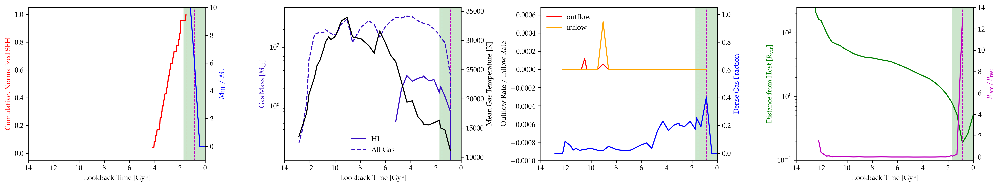

Tquench: 1.52, Tgasloss: 0.43, diff: 1.09
h148-68
Gathering data...


<Figure size 432x288 with 0 Axes>

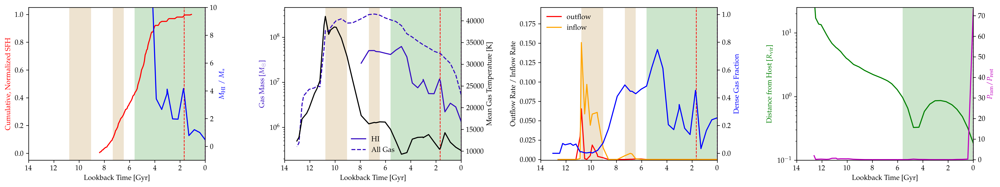

Hasnt lost its gas yet
Tquench: 1.66, Tgasloss: 0.00, diff: 1.66
h148-127
Gathering data...


<Figure size 432x288 with 0 Axes>

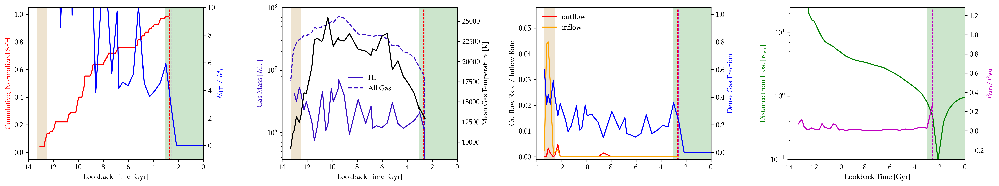

Tquench: 2.69, Tgasloss: 2.15, diff: 0.54
h148-163
Gathering data...


<Figure size 432x288 with 0 Axes>

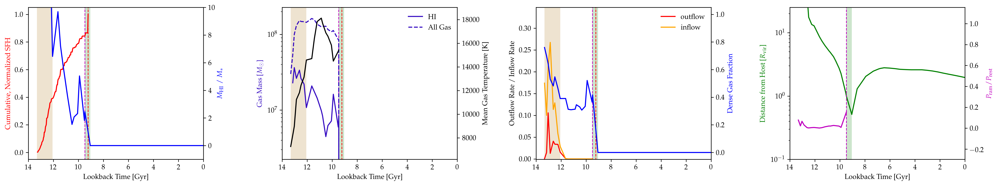

Tquench: 9.22, Tgasloss: 9.05, diff: 0.17
h148-278
Gathering data...


<Figure size 432x288 with 0 Axes>

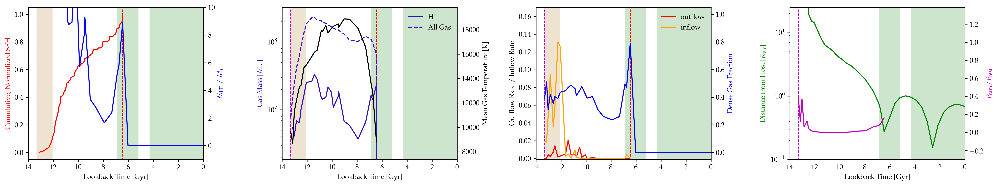

Tquench: 6.46, Tgasloss: 6.03, diff: 0.43
h148-283
Gathering data...


<Figure size 432x288 with 0 Axes>

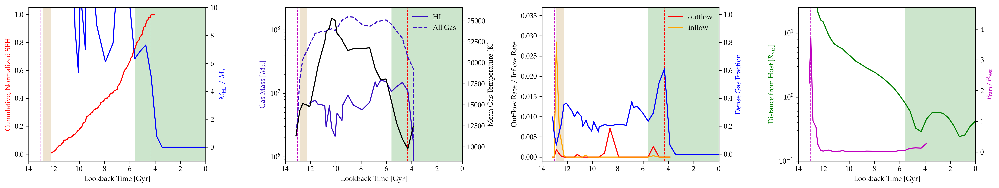

Tquench: 4.32, Tgasloss: 3.45, diff: 0.88
h148-329
Gathering data...


<Figure size 432x288 with 0 Axes>

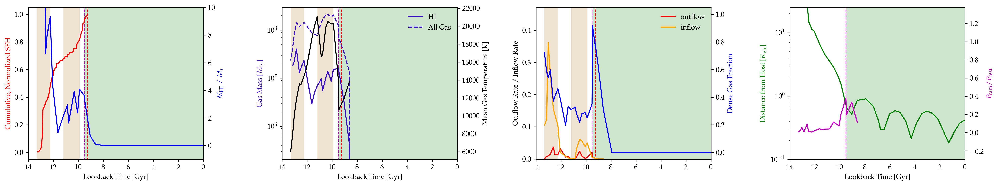

Tquench: 9.26, Tgasloss: 7.93, diff: 1.33
h242-24
Gathering data...


<Figure size 432x288 with 0 Axes>

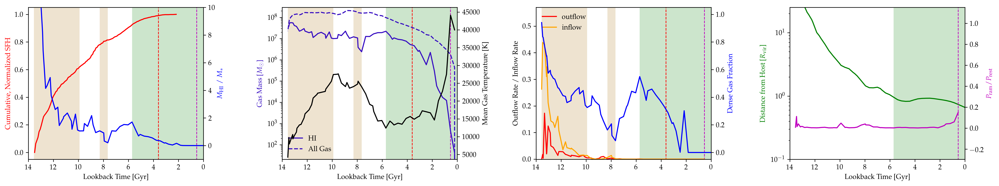

Tquench: 3.61, Tgasloss: 0.22, diff: 3.39
h242-41
Gathering data...


<Figure size 432x288 with 0 Axes>

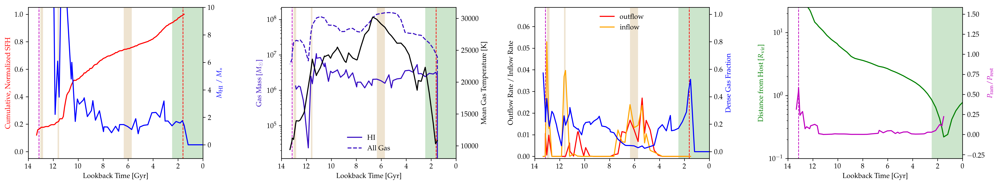

Tquench: 1.61, Tgasloss: 1.19, diff: 0.42
h242-80
Gathering data...


<Figure size 432x288 with 0 Axes>

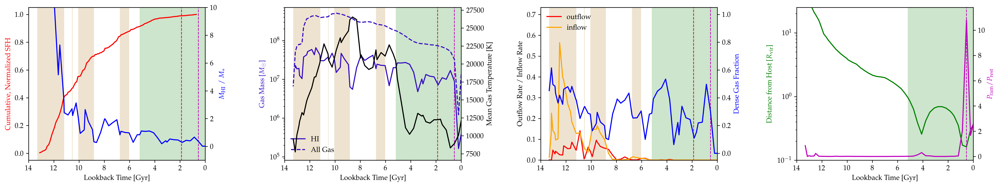

Tquench: 1.88, Tgasloss: 0.22, diff: 1.66
h242-439
Gathering data...


<Figure size 432x288 with 0 Axes>

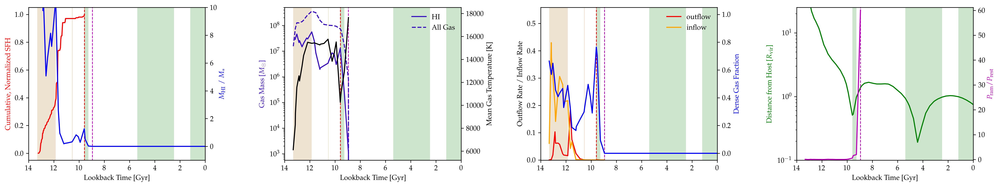

Tquench: 9.58, Tgasloss: 8.94, diff: 0.63
h229-20
Gathering data...


<Figure size 432x288 with 0 Axes>

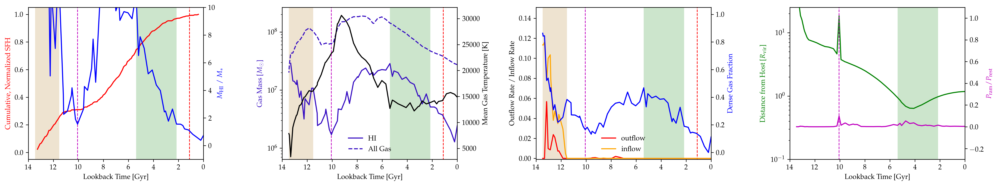

Hasnt lost its gas yet
Tquench: 1.11, Tgasloss: 0.00, diff: 1.11
h229-22
Gathering data...


<Figure size 432x288 with 0 Axes>

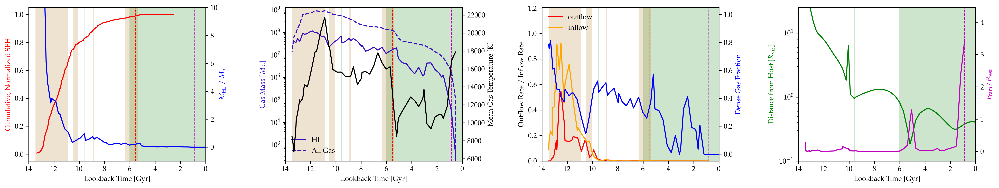

Tquench: 5.53, Tgasloss: 1.51, diff: 4.02
h229-23
Gathering data...


<Figure size 432x288 with 0 Axes>

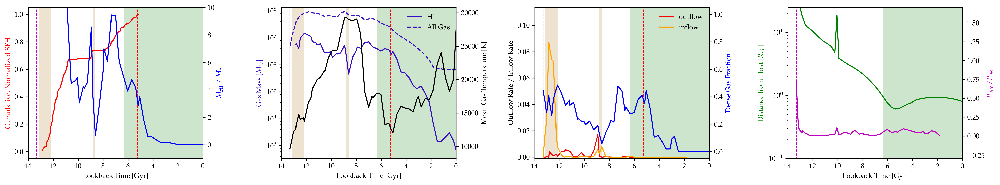

Hasnt lost its gas yet
Tquench: 5.27, Tgasloss: 0.00, diff: 5.27
h229-55
Gathering data...


<Figure size 432x288 with 0 Axes>

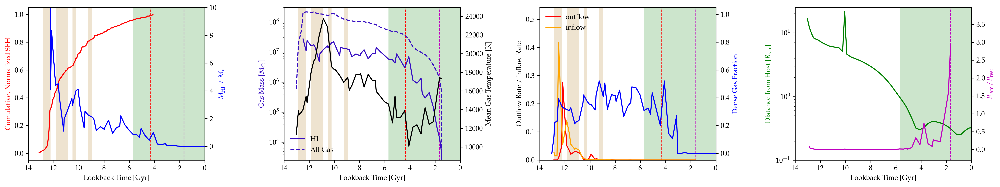

Tquench: 4.34, Tgasloss: 1.51, diff: 2.83
h329-31
Gathering data...


<Figure size 432x288 with 0 Axes>

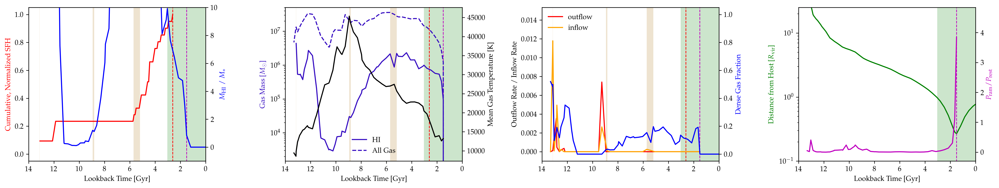

Tquench: 2.61, Tgasloss: 1.19, diff: 1.42
h329-33
Gathering data...


<Figure size 432x288 with 0 Axes>

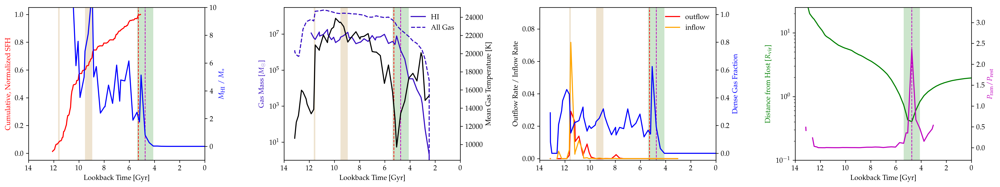

Tquench: 5.28, Tgasloss: 2.48, diff: 2.80


In [214]:
for sim,i in zip(sims,ids):
    print(f'{sim}-{i}')
    tquench, time, gasfrac = CaseStudyPlots(sim,i, ret=True)
    try:
        tgasloss = np.max(time[gasfrac < 0.1])
    except ValueError:
        print('Hasnt lost its gas yet')
        tgasloss = 0
    print(f'Tquench: {tquench:.2f}, Tgasloss: {tgasloss:.2f}, diff: {tquench-tgasloss:.2f}')

In [ ]:
for sim, i in zip(sims,ids):

In [150]:
for sim, i in zip(sims,ids):
    data = read_file(sim,i)
    data = data[data.time > 13.6]
    m = data.mstar.tolist()[0]
    print(f'{sim}-{i}, {m:.2e}')

h148-13, 1.04e+08
h148-28, 8.42e+07
h148-32, 3.17e+06
h148-37, 5.76e+06
h148-45, 1.37e+07
h148-48, 1.27e+05
h148-68, 2.82e+06
h148-127, 3.61e+05
h148-163, 3.64e+06
h148-278, 2.15e+06
h148-283, 2.06e+06
h148-329, 3.98e+06
h242-24, 1.37e+07
h242-41, 1.83e+06
h242-80, 2.35e+07
h242-439, 7.65e+06
h229-20, 3.34e+06
h229-22, 7.71e+07
h229-23, 8.61e+05
h229-55, 6.79e+06
h329-31, 1.10e+05
h329-33, 1.49e+06


In [55]:
q_timescales = []
d_timescales = []

for sim, i in zip(sims,ids):
    QIdata = []
    with open('/home/akinshol/Data/Timescales/QuenchingTimescales_200b.data', 'rb') as f:
        while True:
            try:
                QIdata.append(pickle.load(f,encoding='latin1'))
            except EOFError:
                break

    QIdata = pd.DataFrame(QIdata)
    QIdata = QIdata[(QIdata.sim==sim)&(QIdata.haloid==i)]
    tinfall = QIdata.tinfall.tolist()[0]
    tquench = QIdata.tquench.tolist()[0]
    
    data = read_file(sim,i)
    age = 13.800797497330507
    time = age - np.array(data.time,dtype=float)
    data = data[time==tinfall]
    
    t_until_quench = tinfall-tquench
    
    mHI = data.mHI.tolist()[0]
    sfr = data.sfr.tolist()[0]
    Mout = data.outflow_91.tolist()[0]
    
    t_depl = mHI / (sfr+Mout) / 1e9
    q_timescales.append(t_until_quench)
    d_timescales.append(t_depl)

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/pynbody/array.py:346: RuntimeWarning: divide by zero encountered in true_divide
  return np.ndarray.__truediv__(self, rhs)


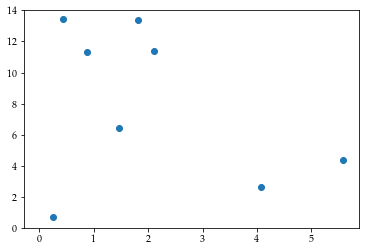

In [57]:
plt.scatter(q_timescales,d_timescales)
plt.ylim(0,14)
plt.show()

In [59]:
data = []
with open('/home/akinshol/Data/Timescales/QuenchingTimescales_200b.data', 'rb') as f:
    while True:
        try:
            data.append(pickle.load(f,encoding='latin1'))
        except EOFError:
            break

data = pd.DataFrame(data)
data = data[~np.isnan(np.array(data.tinfall,dtype=float))]

tquench = np.array(data.tquench, dtype=float)
tquench_lower = np.array(data.tquench_lower,dtype=float)
tquench_upper = np.array(data.tquench_upper,dtype=float)

tgas = np.array(data.tgasloss, dtype=float)
tgas_lower = np.array(data.tgasloss_lower, dtype=float)
tgas_upper = np.array(data.tgasloss_upper, dtype=float)

tHI = np.array(data.tHI, dtype=float)
tHI_lower = np.array(data.tHI_lower, dtype=float)
tHI_upper = np.array(data.tHI_upper, dtype=float)

newids = np.array(data.haloid, dtype=int)
sim = np.array(data.sim, dtype=str)
mstar = np.array(data.M_star, dtype=float)


tgas_upper_error = np.abs(tgas_upper - tgas)
tgas_lower_error = np.abs(tgas_lower - tgas)
tHI_upper_error = np.abs(tHI_upper - tHI)
tHI_lower_error = np.abs(tHI_lower - tHI)


tinfall = np.array(data.tinfall, dtype=float)
tinfall_lower = np.array(data.tinfall_lower,dtype=float)
tinfall_upper = np.array(data.tinfall_upper,dtype=float)


newids = np.array(data.haloid, dtype=int)
sim = np.array(data.sim, dtype=str)
mstar = np.array(data.M_star, dtype=float)
mvir = np.array(data.mass, dtype=float)
ecc = np.array(data.eccentricity, dtype=float)
periapsis = np.array(data.periapsis, dtype=float)

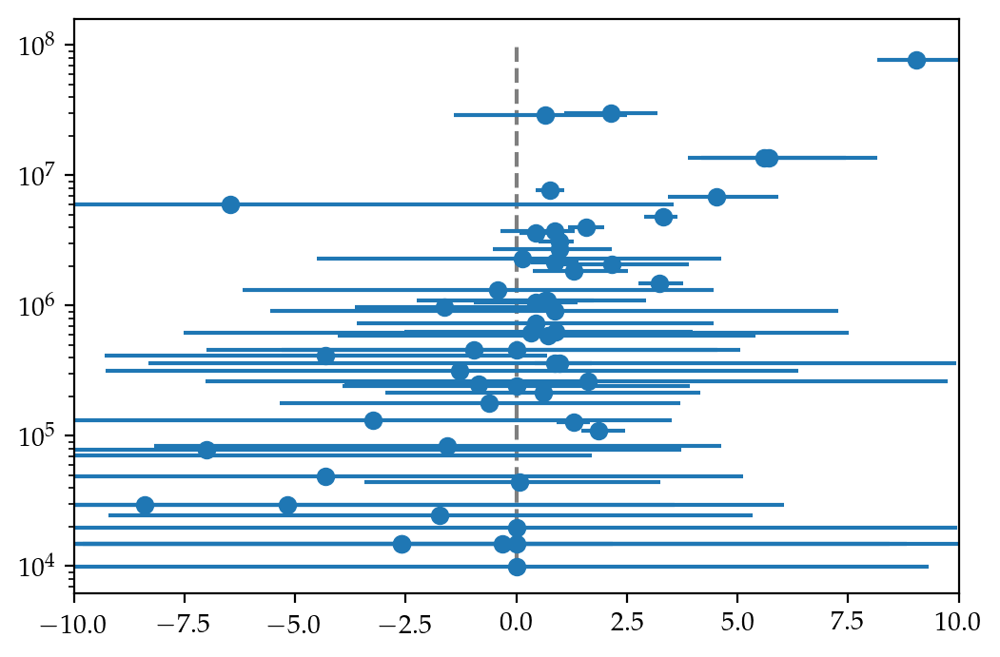

In [61]:

upper_error = np.sqrt((tinfall_lower-tquench)**2 + (tgas_upper-tgas)**2 + (0.31722272420473)**2)
lower_error = np.sqrt((tinfall_upper-tquench)**2 + (tgas_lower-tgas)**2 + (0.31722272420473)**2)

plt.figure(dpi=200)
plt.errorbar(tinfall-tgas, mstar, xerr=np.array([lower_error,upper_error]), fmt='o')
plt.semilogy()
plt.plot([0,0],[1e4,1e8],'k--',alpha=0.5,zorder=0)
plt.xlim(-10,10)
plt.show()

In [18]:
data = read_file('h148',2)
time = np.array(data.time,dtype=float)
print(time)

[13.8007975  13.36981712 12.93883674 12.50785636 12.15095073 12.07687598
 11.6458956  11.21491521 10.78393483 10.76709966 10.35295445  9.92197407
  9.49099369  9.06001331  8.60883073  8.19805255  7.76707217  7.33609179
  7.03979278  6.90511141  6.47413103  5.86806487  5.18118989  4.75020951
  4.31922913  4.28219175  3.88824875  3.73336517  3.45726837  3.28891666
  3.02628799  2.92527696  2.59530761  2.36971631  2.16432723  1.73334685
  1.54479293  1.30236646  1.1777862   0.93535973  0.76700802  0.64242776
  0.47744308]


In [20]:
np.mean(np.abs(np.diff(time)))

0.31722272420473

In [36]:
data = read_file('h229',20)
tinfall = np.min(data.time[data.h1dist < 1])

In [37]:
data = data[data.time == tinfall]
data.mHI / data.sfr / 1e9

451    37.34084838531742
dtype: object

In [38]:
data = read_file('h329',33)

In [42]:
data.haloid[(data.time > 9.7)&(data.time < 9.72)]

163    31.0
Name: haloid, dtype: float64

In [43]:
# snapshots 2304 and 2880
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots_200bkgdens/h329.cosmo50PLK.3072gst5HbwK1BH.002304')
s.physical_units()
h = s.halos()
halo = h[16]
np.min(halo.s['age'].in_units('Myr'))

SimArray(5.07036351, 'Myr')

In [44]:
rho = np.array(halo.g['rho'], dtype=float)
temp = np.array(halo.g['temp'], dtype=float)
hi = np.array(halo.g['HI'], dtype=float)

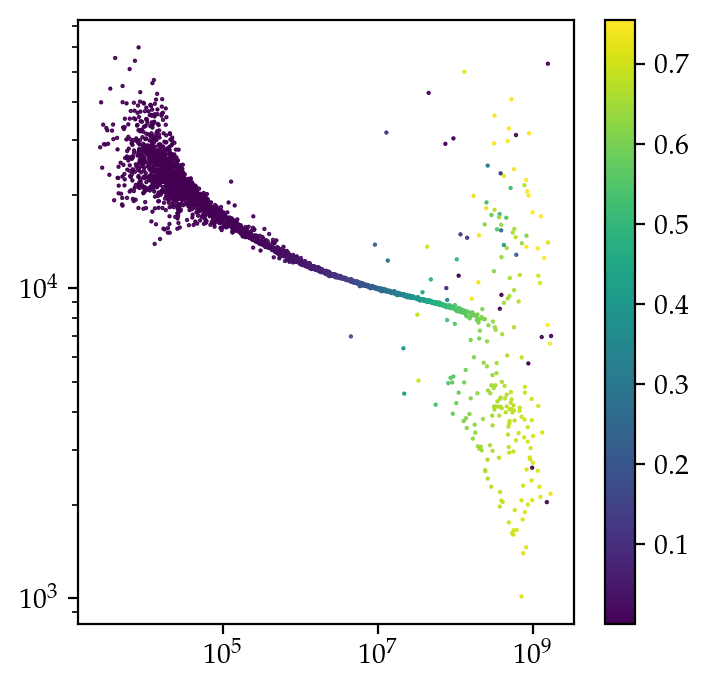

In [45]:
fig = plt.figure(figsize=(4,4),dpi=200)
ax = fig.gca()
im = ax.scatter(rho,temp, s=0.3, c=hi)
cbar = fig.colorbar(im, ax=ax)
ax.loglog()
plt.show()

56.61 kpc


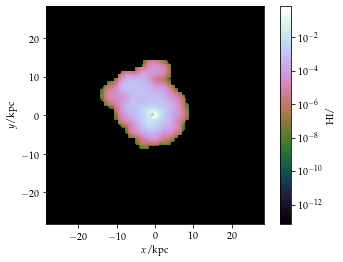

In [13]:
pynbody.analysis.halo.center(halo)
width = str(round(halo.properties['Rvir']/s.properties['h']*s.properties['a']*2,2))+' kpc'
print(width)
pynbody.plot.sph.image(halo.g, qty='HI', width = width, cmap='cubehelix' )
plt.show()

In [22]:
# snapshots 2304 and 2880
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots_200bkgdens/h329.cosmo50PLK.3072gst5HbwK1BH.002880')
s.physical_units()
h = s.halos()
halo = h[31]

56.79 kpc


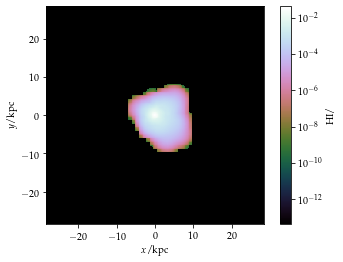

In [15]:
pynbody.analysis.halo.center(halo)
width = str(round(halo.properties['Rvir']/s.properties['h']*s.properties['a']*2,2))+' kpc'
print(width)
pynbody.plot.sph.image(halo.g, qty='HI', width = width, cmap='cubehelix' )
plt.show()

In [23]:
rho = np.array(halo.g['rho'], dtype=float)
temp = np.array(halo.g['temp'], dtype=float)

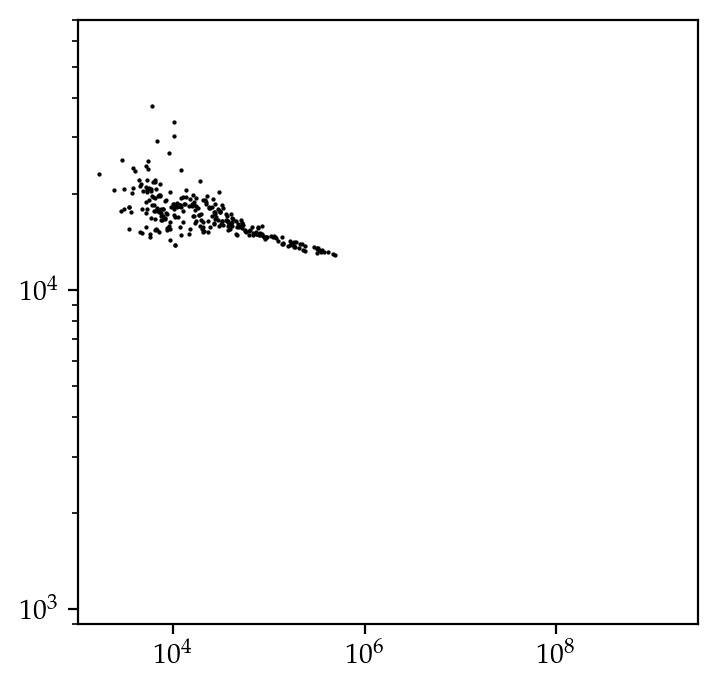

In [25]:
plt.figure(figsize=(4,4),dpi=200)
plt.scatter(rho,temp, s=0.3, c='k')
plt.loglog()
plt.xlim(1e3,3e9)
plt.ylim(9e2,7e4)
plt.show()

In [16]:
np.min(halo.s['age'].in_units('Myr'))

SimArray(987.40503505, 'Myr')

In [27]:
halo.g['r']

SimArray([2964.30764676, 2966.11603937, 2963.11660552, 2964.70317849,
          2965.15730855, 2965.3963749 , 2966.63935751, 2963.60906094,
          2964.73604295, 2963.2871302 , 2964.21489968, 2966.09146915,
          2964.47882476, 2964.8959531 , 2962.15213094, 2966.3806092 ,
          2965.80529491, 2966.77981731, 2966.4964909 , 2965.24440561,
          2969.04967891, 2965.58885146, 2962.85417193, 2962.92497621,
          2963.65675316, 2963.98834085, 2962.95873877, 2964.55985351,
          2963.49940544, 2965.1396484 , 2966.61858951, 2963.51412161,
          2967.05768057, 2965.60692847, 2964.4657823 , 2962.64630121,
          2968.6643369 , 2965.5400803 , 2962.03503339, 2966.41457495,
          2964.7198725 , 2963.35930991, 2963.9790727 , 2964.52073927,
          2964.22499599, 2969.06572217, 2967.57736231, 2963.33435893,
          2961.48359723, 2961.74266444, 2963.67726653, 2962.94003228,
          2965.04079802, 2964.03443171, 2967.02555988, 2965.15712432,
          2967.36179

In [39]:
haloids = [33, 33, 34, 34, 33, 33, 33, 35, 35, 34, 34, 32, 32, 32, 31, 31, 27, 27, 28, 32, 17, 16, 16, 16, 15, 14, 13, 15, 14, 14, 13, 12, 12, 12, 12, 15, 14, 16, 15, 14, 14, 15, 15, 14, 17, 17, 22, 69, 52, 50, 52, 65, 95, 179, 196, 189, 212, 205]
snapnums = ['004096', '004032', '003936', '003840', '003744', '003648', '003606', '003552', '003456', '003360', '003264', '003195', '003168', '003072','002976', '002880', '002784', '002688', '002592', '002554', '002496', '002400', '002304','002208', '002112', '002088', '002016', '001920', '001824','001740','001728','001632', '001536', '001475', '001440', '001344', '001269', '001248','001152', '001106', '001056', '000974', '000960','000864', '000776', '000768', '000672', '000637', '000576', '000480', '000456', '000384', '000347', '000288', '000275', '000225', '000192', '000188', '000139', '000107', '000096', '000071']
snapnums[13]

'003072'

In [36]:
for s, h in zip(snapnums, haloids):
    print(s,'\t',h)

004096 	 31
004032 	 31
003936 	 27
003840 	 25
003744 	 25
003648 	 25
003606 	 24
003552 	 25
003456 	 25
003360 	 24
003264 	 25
003195 	 25
003168 	 26
003072 	 28
002976 	 26
002880 	 27
002784 	 27
002688 	 28
002592 	 29
002554 	 27
002496 	 29
002400 	 28
002304 	 29
002208 	 28
002112 	 29
002088 	 30
002016 	 29
001920 	 28
001824 	 28
001740 	 29
001728 	 29
001632 	 28
001536 	 28
001475 	 30
001440 	 29
001344 	 30
001269 	 30
001248 	 28
001152 	 30
001106 	 31
001056 	 27
000974 	 23
000960 	 23
000864 	 25
000776 	 27
000768 	 27
000672 	 42
000637 	 34
000576 	 40
000480 	 45
000456 	 43
000384 	 39
000347 	 80
000288 	 90
000275 	 89
000225 	 78
000192 	 66
000188 	 65


In [37]:
snapnums[13:25]

['003072',
 '002976',
 '002880',
 '002784',
 '002688',
 '002592',
 '002554',
 '002496',
 '002400',
 '002304',
 '002208',
 '002112']

Loaded snapshot 002112
Centered
Total gas mass 1.04e+08, sSFR 0.00e+00


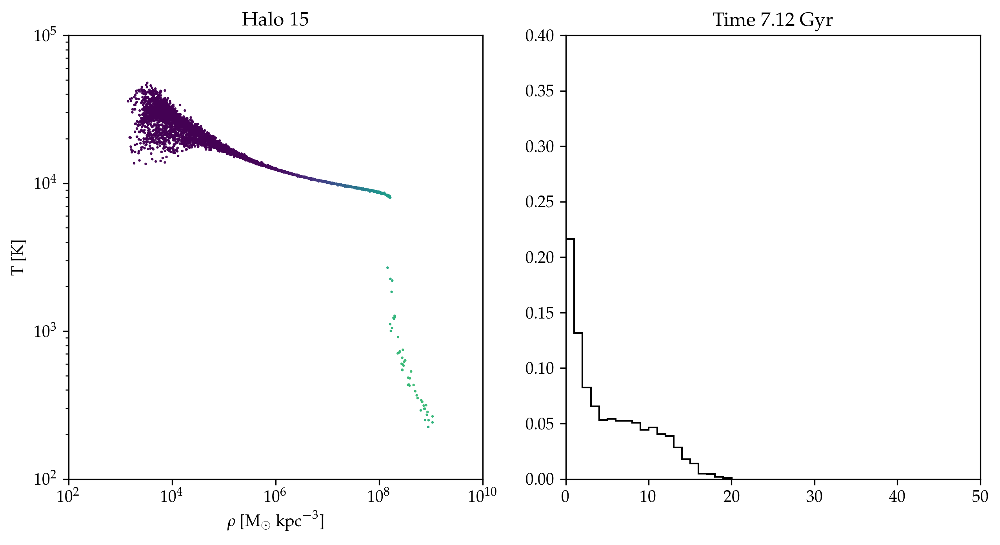

Loaded snapshot 002208
Centered
Total gas mass 9.09e+07, sSFR 1.38e-10


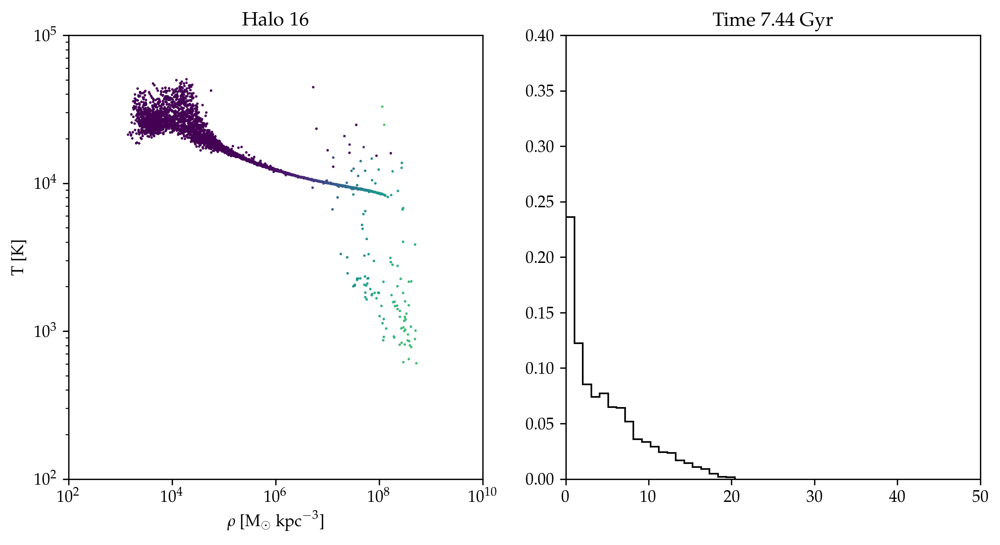

Loaded snapshot 002304
Centered
Total gas mass 8.30e+07, sSFR 3.15e-10


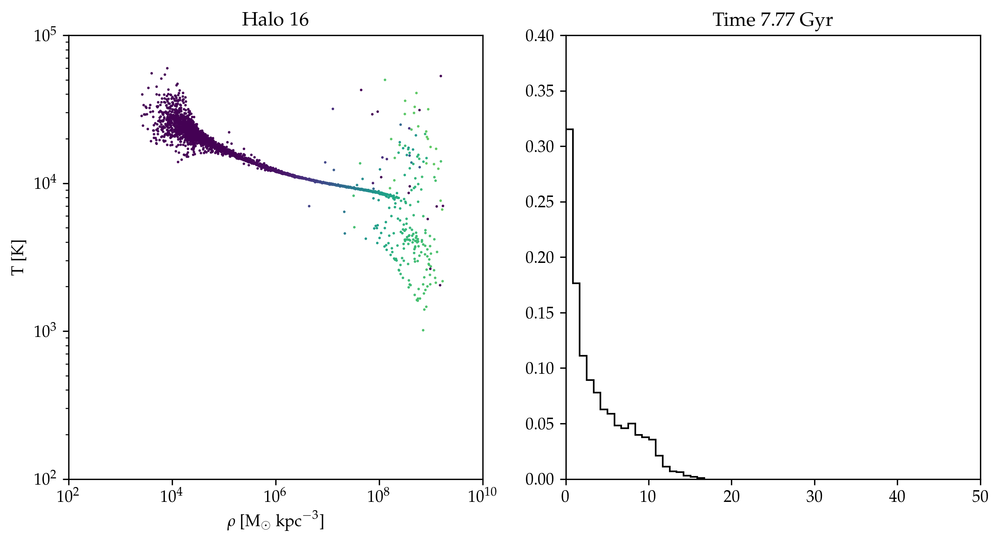

Loaded snapshot 002400
Centered
Total gas mass 8.83e+07, sSFR 4.09e-11


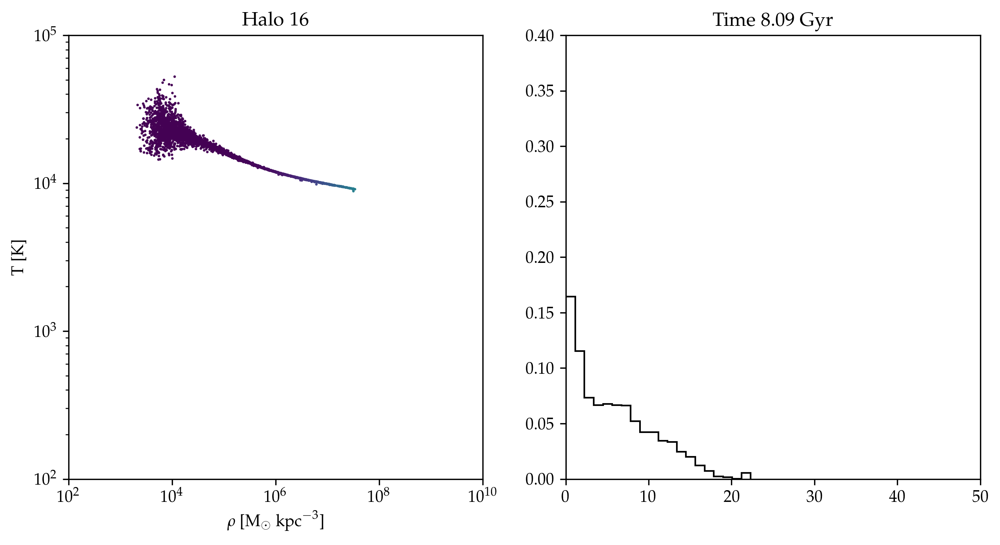

Loaded snapshot 002496
Centered
Total gas mass 6.13e+07, sSFR 0.00e+00


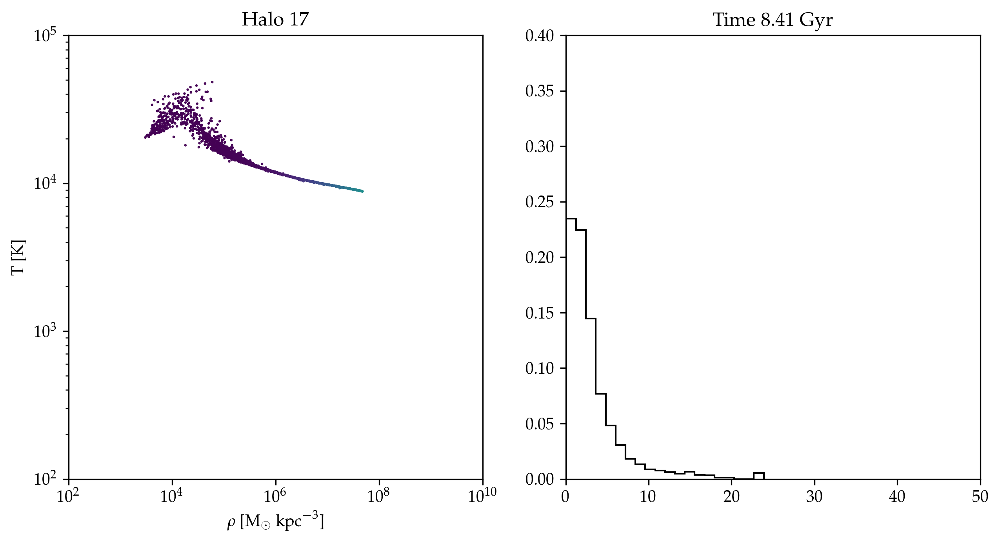

Loaded snapshot 002554
Centered
Total gas mass 4.49e+07, sSFR 1.28e-10


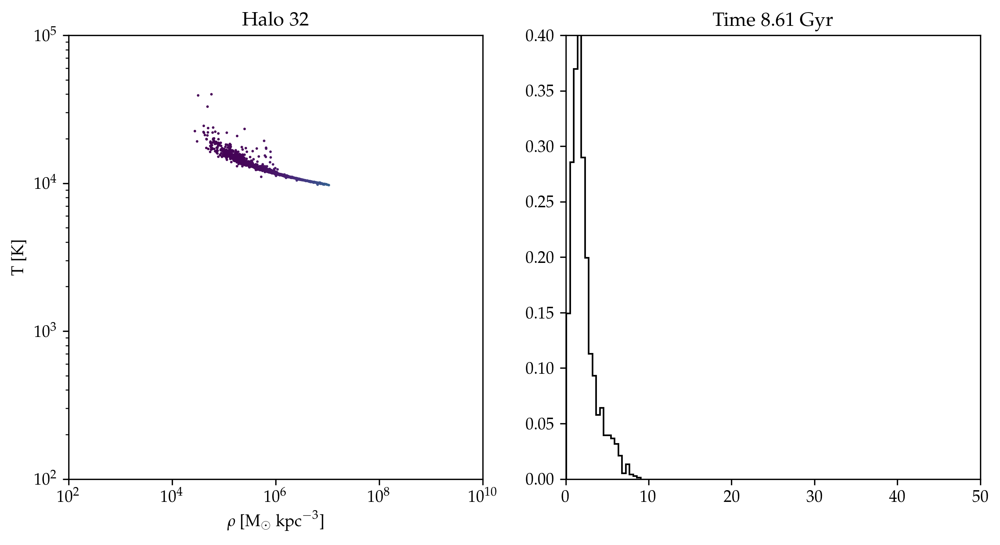

Loaded snapshot 002592
Centered
Total gas mass 3.06e+07, sSFR 9.35e-11


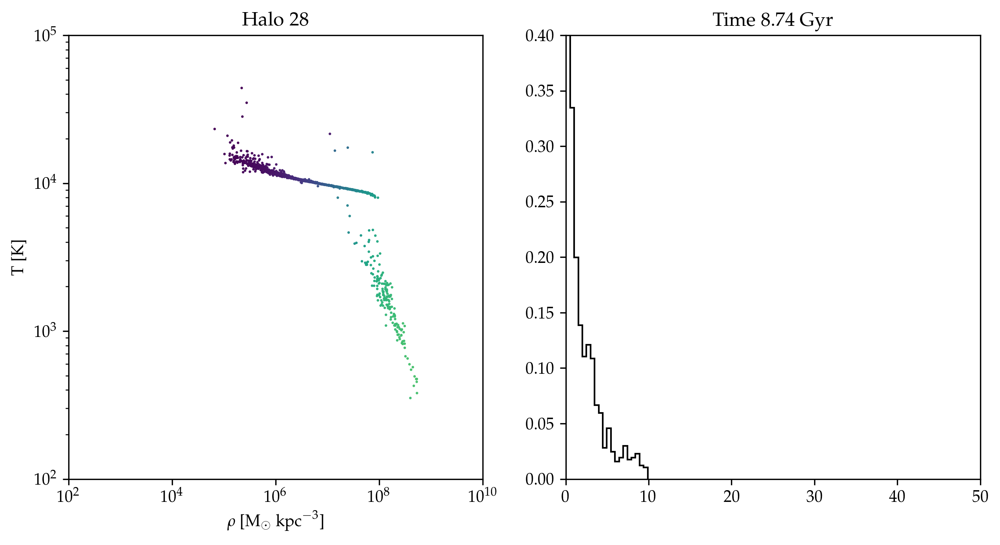

Loaded snapshot 002688
Centered
Total gas mass 1.77e+07, sSFR 0.00e+00


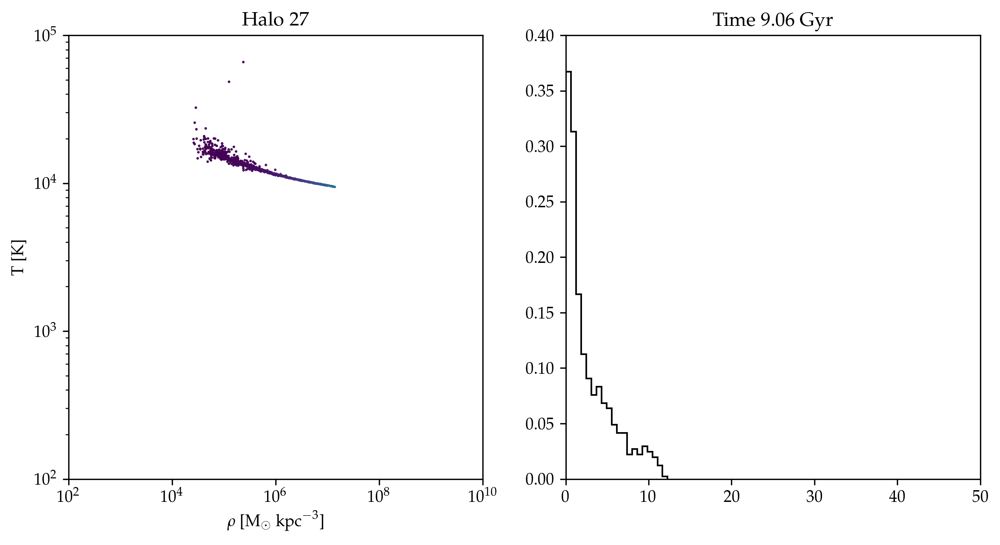

Loaded snapshot 002784
Centered
Total gas mass 1.15e+07, sSFR 0.00e+00


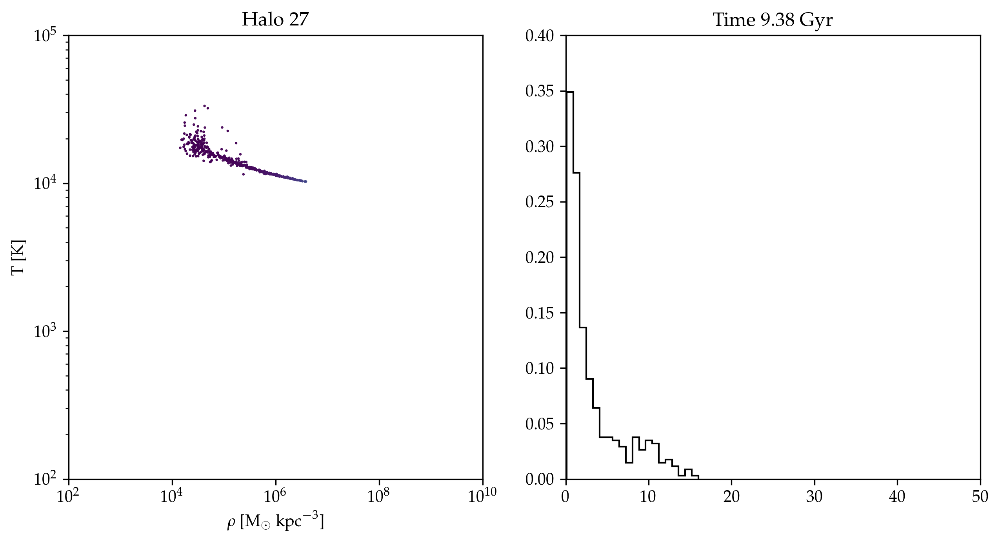

Loaded snapshot 002880
Centered
Total gas mass 7.39e+06, sSFR 0.00e+00


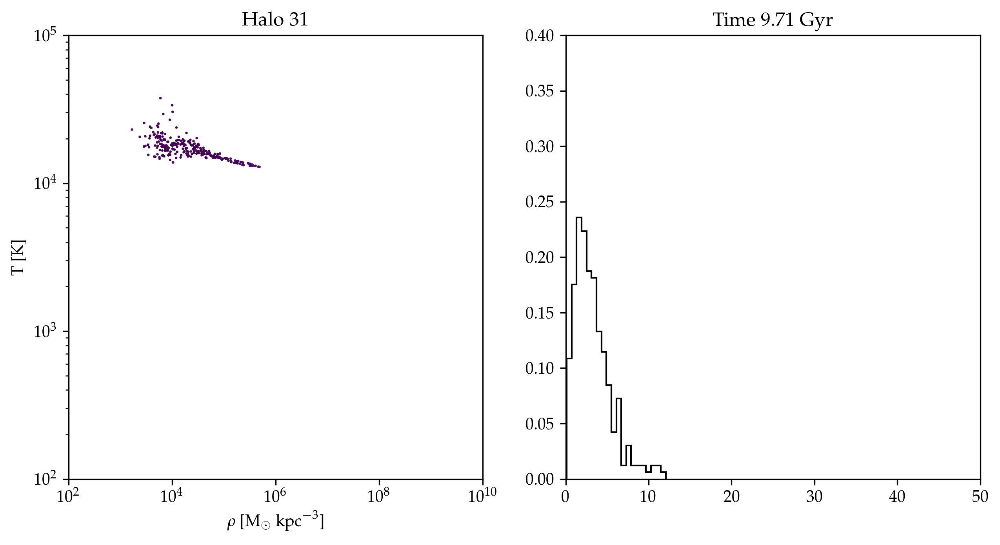

Loaded snapshot 002976
Centered
Total gas mass 4.19e+06, sSFR 0.00e+00


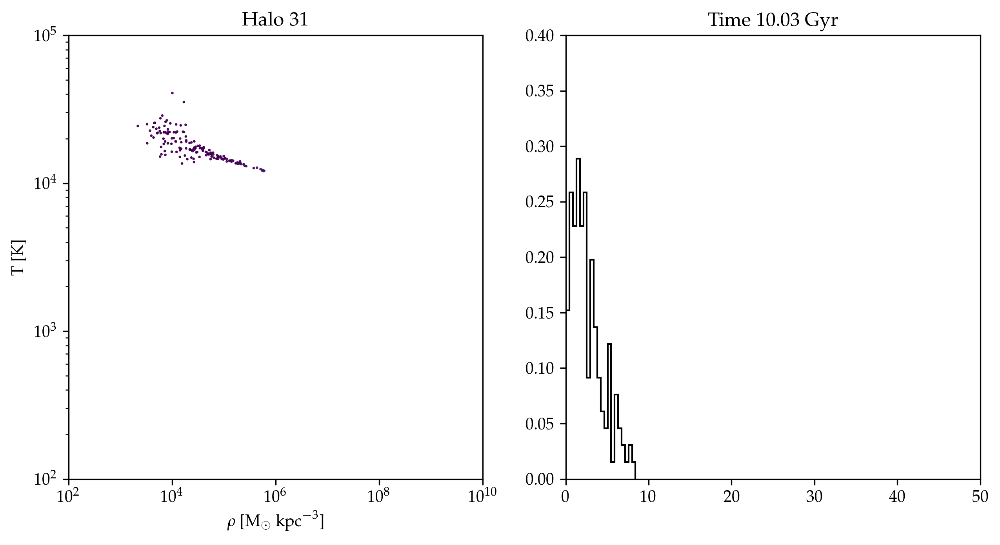

Loaded snapshot 003072
Centered
Total gas mass 3.03e+06, sSFR 0.00e+00


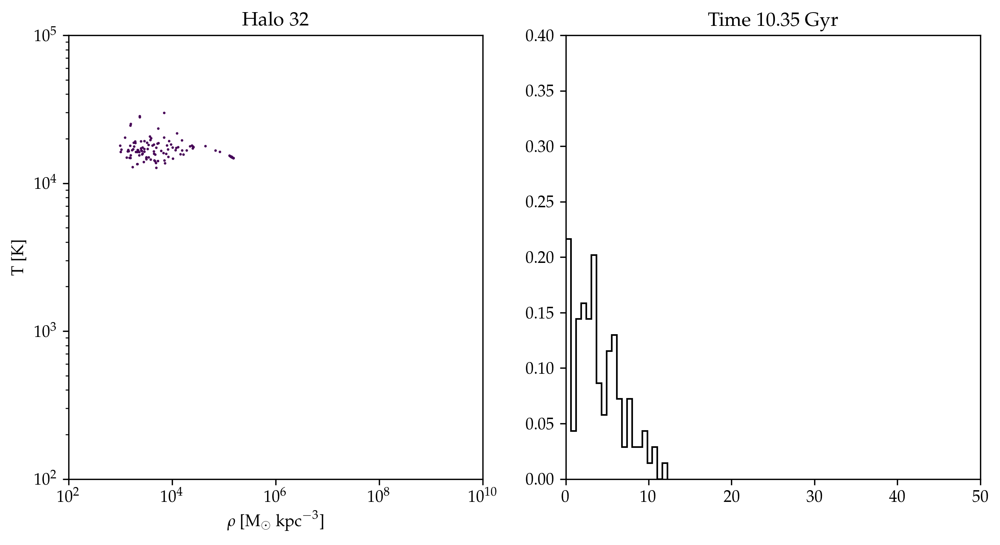

In [48]:
for snapnum, haloid in zip(np.flip(snapnums[13:25]), np.flip(haloids[13:25])):
    snapshot = '/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots_200bkgdens/h329.cosmo50PLK.3072gst5HbwK1BH.'+snapnum
    
    s = pynbody.load(snapshot)
    s.physical_units()
    h = s.halos()
    halo = h[haloid]
    print(f'Loaded snapshot {snapnum}')
    
    t = s.properties['time'].in_units('Gyr')
    
    pynbody.analysis.halo.center(halo)
    print('Centered')
    
    r = np.array(halo.g['r'],dtype=float)
    
    temp = np.array(halo.g['temp'],dtype=float)
    rho = np.array(halo.g['rho'],dtype=float)
    
    age = np.array(halo.s['age'].in_units('Myr'),dtype=float)
    hi = np.array(halo.g['HI'], dtype=float)
    sfr = np.sum(halo.s['mass'][age < 100]) / 1e8
    mstar = np.sum(halo.s['mass'].in_units('Msol'))
    mgas= np.sum(halo.g['mass'].in_units('Msol'))
    sSFR = sfr/mstar
    
    print(f"Total gas mass {mgas:.2e}, sSFR {sSFR:.2e}")
    
    fig, ax = plt.subplots(1,2,figsize=(10,5),dpi=300)
    ax[0].scatter(rho,temp,s=0.3,c=hi, vmin=0, vmax=1)
    ax[0].set_xlabel(r'$\rho$ [$\mathrm{M}_{\odot}\ \mathrm{kpc}^{-3}$]')
    ax[0].set_ylabel(r'T [K]')
    ax[0].loglog()
    ax[0].set_xlim(1e2,1e10)
    ax[0].set_ylim(1e2,1e5)
    
    ax[1].hist(r, bins=20, histtype='step', color='k', density=True)
    ax[1].set_xlim(0,50)
    ax[1].set_ylim(0,.4)
    
    ax[0].set_title(f'Halo {haloid}')
    ax[1].set_title(f'Time {t:.2f} Gyr')
    
    plt.savefig(f'Density_Temp_Movie/{snapnum}.png')
    plt.show()
    

In [49]:
import imageio
import os

path = '/home/akinshol/Data/Timescales/Density_Temp_Movie/'

image_folder = os.fsencode(path)
filenames = []
for file in os.listdir(image_folder):
    filename = os.fsdecode(file)
    if filename.endswith('.png'):
        filenames.append(filename)
    
filenames.sort()
print(filenames)

images = list(map(lambda filename: imageio.imread(path+filename), filenames))

s = 30

imageio.mimsave('density_temp.gif', images, duration = s/60)

['002112.png', '002208.png', '002304.png', '002400.png', '002496.png', '002554.png', '002592.png', '002688.png', '002784.png', '002880.png', '002976.png', '003072.png']


In [124]:
data = read_file('h229',55)

for i in range(len(data)):
    t = data.t.tolist()[i]
    print(f'{t:.2f} Gyr')
    if data.mgas.tolist()[i] == 0:
        continue
    
    rho = data.gas_rho.tolist()[i]
    temp = data.gas_temp.tolist()[i]
    hi = data.gas_hi.tolist()[i]
    r = data.gas_r.tolist()[i]
    rvir = data.Rvir.tolist()[i]
    
    fig, ax = plt.subplots(1,2,figsize=(10,5),dpi=300)
    ax[0].scatter(rho,temp,s=0.3,c=hi, vmin=0, vmax=1)
    ax[0].set_xlabel(r'$\rho$ [$\mathrm{M}_{\odot}\ \mathrm{kpc}^{-3}$]')
    ax[0].set_ylabel(r'T [K]')
    ax[0].loglog()
    ax[0].set_xlim(1e2,1e10)
    ax[0].set_ylim(1e2,1e5)
    
    ax[1].hist(r, bins=20, histtype='step', color='k', density=True)
    ax[1].set_xlim(0,30)
    ax[1].set_ylim(0,.7)
    
    ax[0].set_title(f'Halo 55')
    ax[1].set_title(f'Time {t:.2f} Gyr')
    fig.show()

13.80 Gyr
13.59 Gyr
13.26 Gyr
12.94 Gyr
12.62 Gyr
12.29 Gyr
12.15 Gyr
11.97 Gyr
11.65 Gyr
11.32 Gyr
11.00 Gyr
10.77 Gyr
10.68 Gyr
10.35 Gyr
10.03 Gyr
9.71 Gyr
9.38 Gyr
9.06 Gyr
8.74 Gyr
8.61 Gyr
8.41 Gyr
8.09 Gyr
7.77 Gyr
7.44 Gyr
7.12 Gyr
7.04 Gyr
6.80 Gyr


/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


6.47 Gyr
6.15 Gyr
5.87 Gyr
5.83 Gyr
5.50 Gyr
5.18 Gyr
4.98 Gyr
4.86 Gyr
4.53 Gyr
4.28 Gyr
4.21 Gyr
3.89 Gyr
3.73 Gyr
3.57 Gyr
3.29 Gyr
3.24 Gyr
2.92 Gyr
2.62 Gyr
2.60 Gyr
2.27 Gyr
2.15 Gyr
1.95 Gyr
1.63 Gyr
1.54 Gyr
1.30 Gyr
1.18 Gyr
0.98 Gyr
0.94 Gyr
0.77 Gyr
Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7f2628f6fb70> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f2628f9f840> (for post_execute):


KeyboardInterrupt: 

In [122]:
data = read_file('h229',55)
mean_rhos = np.array([])
frac_SF_gas = np.array([])
for i in range(len(data)):
    mass = data.gas_mass.tolist()[i]
    rho = data.gas_rho.tolist()[i]
    temp = data.gas_temp.tolist()[i]
    Mgas = np.sum(mass)
    
    
    mean_rho = np.sum(mass*rho)/Mgas
    M_SF = np.sum(mass[(rho>1e7)&(temp<1e4)])
    frac_SF_gas = np.append(frac_SF_gas, M_SF / Mgas)
    mean_rhos = np.append(mean_rhos,mean_rho)    

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in double_scalars
  # This is added back by InteractiveShellApp.init_path()
/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in double_scalars
  del sys.path[0]


In [91]:
c_sfh, bc = cumulative_sfh('h229', 55)

<Figure size 432x288 with 0 Axes>

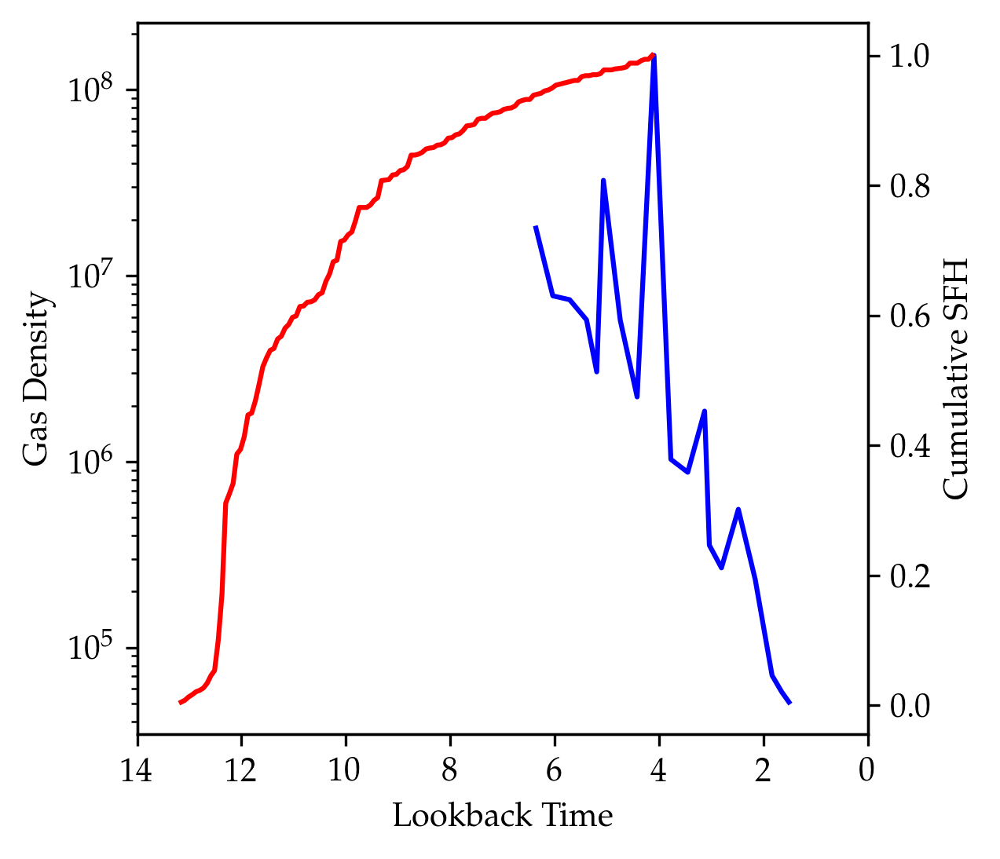

In [104]:
fig, ax = plt.subplots(1,1,figsize=(4,4),dpi=300)

ax.plot(age - data.time, mean_rhos,'b')
ax.set_xlim(14,0)
ax.semilogy()
ax.set_ylabel('Gas Density')
ax.set_xlabel('Lookback Time')

ax1 = ax.twinx()
ax1.plot(bc, c_sfh,'r')
ax1.set_ylabel('Cumulative SFH')

fig.show()

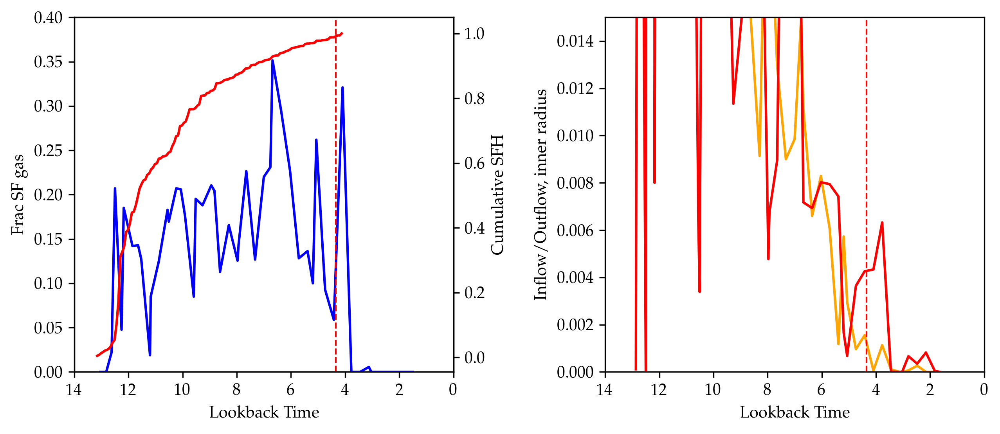

In [123]:
fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=300)

ax[0].plot(age - data.time, frac_SF_gas,'b')
ax[0].set_xlim(14,0)
ax[0].set_ylim(0,0.4)
ax[0].set_ylabel('Frac SF gas')
ax[0].set_xlabel('Lookback Time')

ax1 = ax[0].twinx()
ax1.plot(bc, c_sfh,'r')
ax1.set_ylabel('Cumulative SFH')

ax[1].plot(age - data.time, np.abs(data.inflow_23), 'orange', label='inflow')
ax[1].plot(age - data.time, data.outflow_23, 'r', label='outflow')
ax[1].set_xlim(14,0)
ax[1].set_xlabel('Lookback Time')
ax[1].set_ylabel('Inflow/Outflow, inner radius')
ax[1].set_ylim(0,0.015)

tquench = np.max(bc[c_sfh > 0.99])
for i in [0,1]:
    ax[i].plot([tquench,tquench],[0,0.99], 'r--', linewidth=1)

fig.subplots_adjust(wspace=0.4)
fig.show()

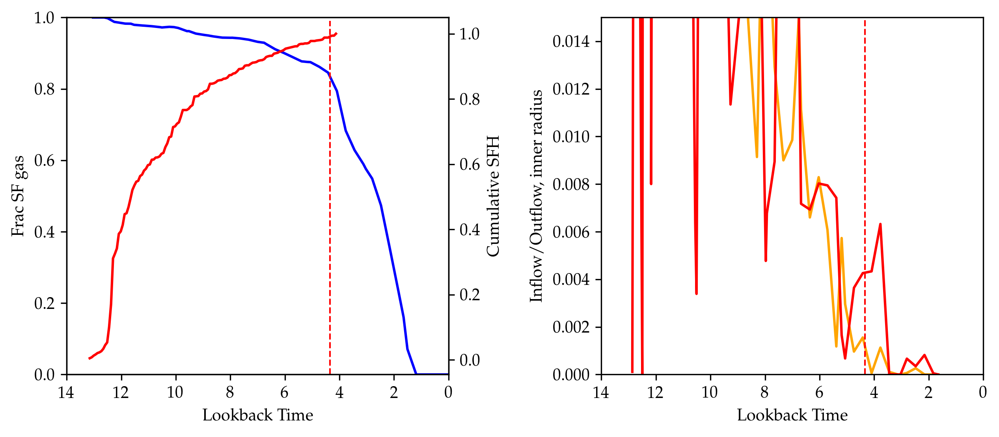

In [126]:
fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=300)

ax[0].plot(age - data.time, data.gasfrac,'b')
ax[0].set_xlim(14,0)
ax[0].set_ylim(0,1)
ax[0].set_ylabel('Frac SF gas')
ax[0].set_xlabel('Lookback Time')

ax1 = ax[0].twinx()
ax1.plot(bc, c_sfh,'r')
ax1.set_ylabel('Cumulative SFH')

ax[1].plot(age - data.time, np.abs(data.inflow_23), 'orange', label='inflow')
ax[1].plot(age - data.time, data.outflow_23, 'r', label='outflow')
ax[1].set_xlim(14,0)
ax[1].set_xlabel('Lookback Time')
ax[1].set_ylabel('Inflow/Outflow, inner radius')
ax[1].set_ylim(0,0.015)

tquench = np.max(bc[c_sfh > 0.99])
for i in [0,1]:
    ax[i].plot([tquench,tquench],[0,0.99], 'r--', linewidth=1)

fig.subplots_adjust(wspace=0.4)
fig.show()

In [127]:
c_sfh, bc = cumulative_sfh('h148', 278)

<Figure size 432x288 with 0 Axes>

In [128]:
data = read_file('h148',278)

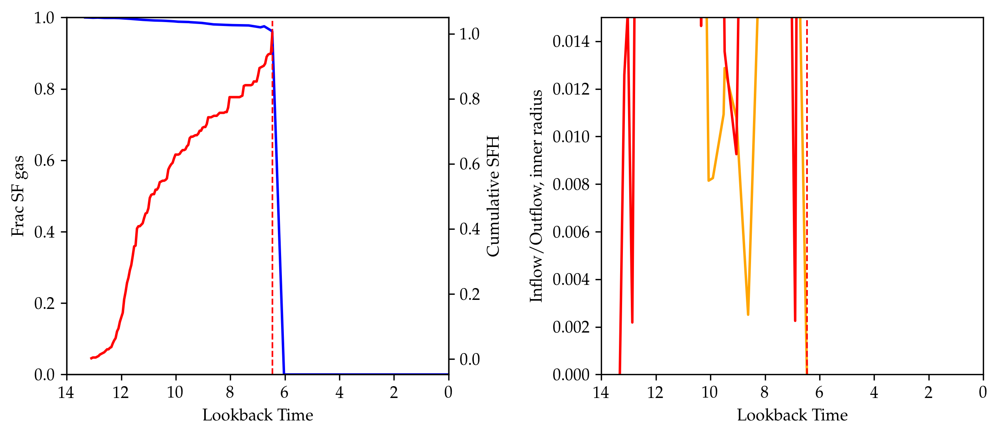

In [129]:
fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=300)

ax[0].plot(age - data.time, data.gasfrac,'b')
ax[0].set_xlim(14,0)
ax[0].set_ylim(0,1)
ax[0].set_ylabel('Frac SF gas')
ax[0].set_xlabel('Lookback Time')

ax1 = ax[0].twinx()
ax1.plot(bc, c_sfh,'r')
ax1.set_ylabel('Cumulative SFH')

ax[1].plot(age - data.time, np.abs(data.inflow_23), 'orange', label='inflow')
ax[1].plot(age - data.time, data.outflow_23, 'r', label='outflow')
ax[1].set_xlim(14,0)
ax[1].set_xlabel('Lookback Time')
ax[1].set_ylabel('Inflow/Outflow, inner radius')
ax[1].set_ylim(0,0.015)

tquench = np.max(bc[c_sfh > 0.99])
for i in [0,1]:
    ax[i].plot([tquench,tquench],[0,0.99], 'r--', linewidth=1)

fig.subplots_adjust(wspace=0.4)
fig.show()

In [195]:
data = read_file('h329',33)
c_sfh, bc = cumulative_sfh('h329', 33)

<Figure size 432x288 with 0 Axes>

In [196]:
tquench = np.max(bc[c_sfh > 0.99])

In [201]:
time = np.array(age - data.time)
np.max(np.array(range(len(time)))[time<tquench])

19

/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


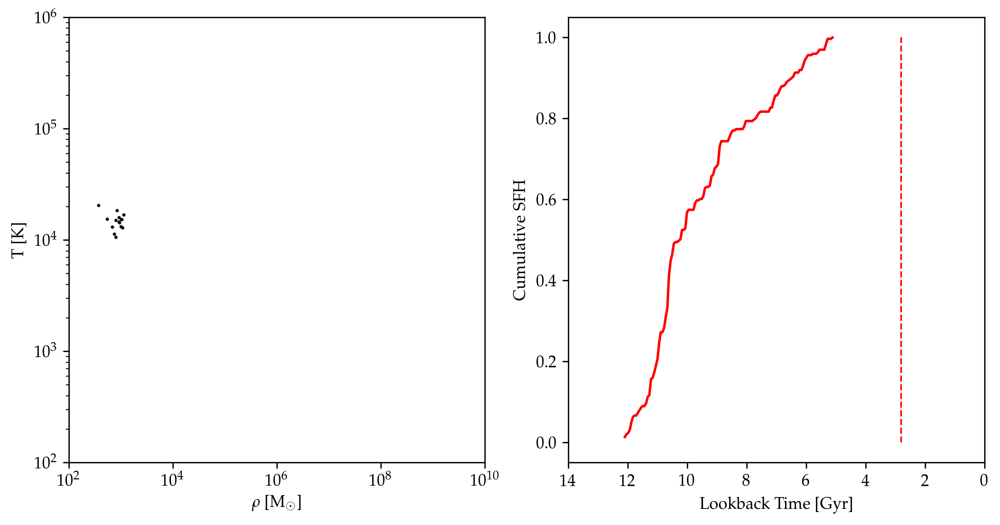

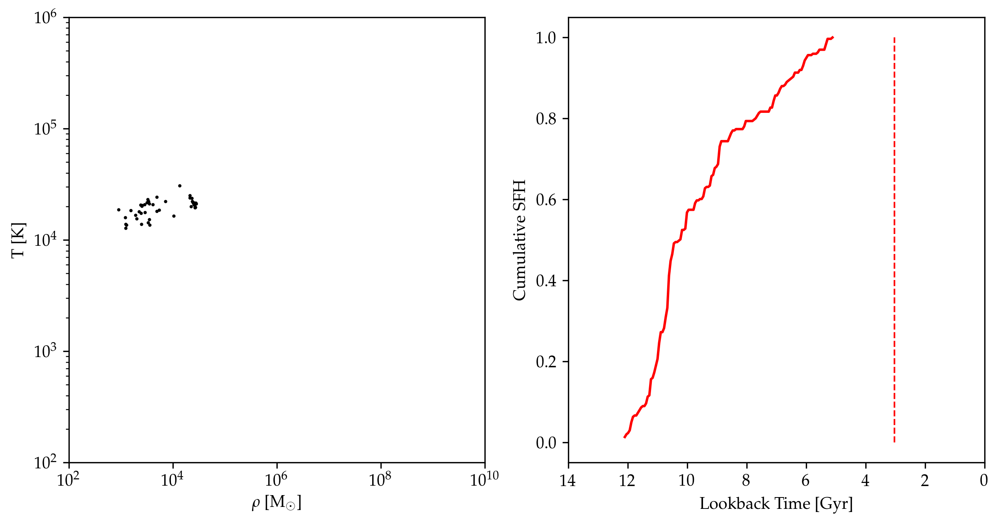

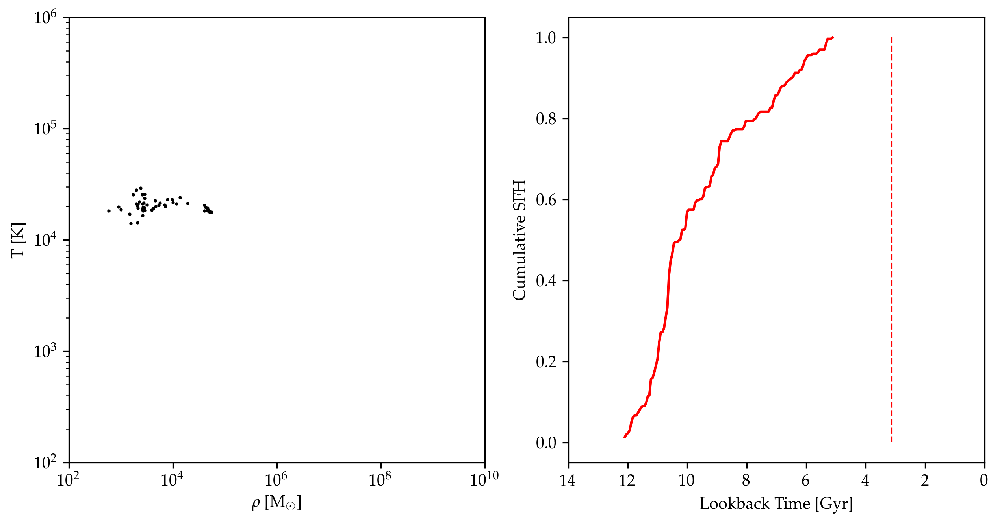

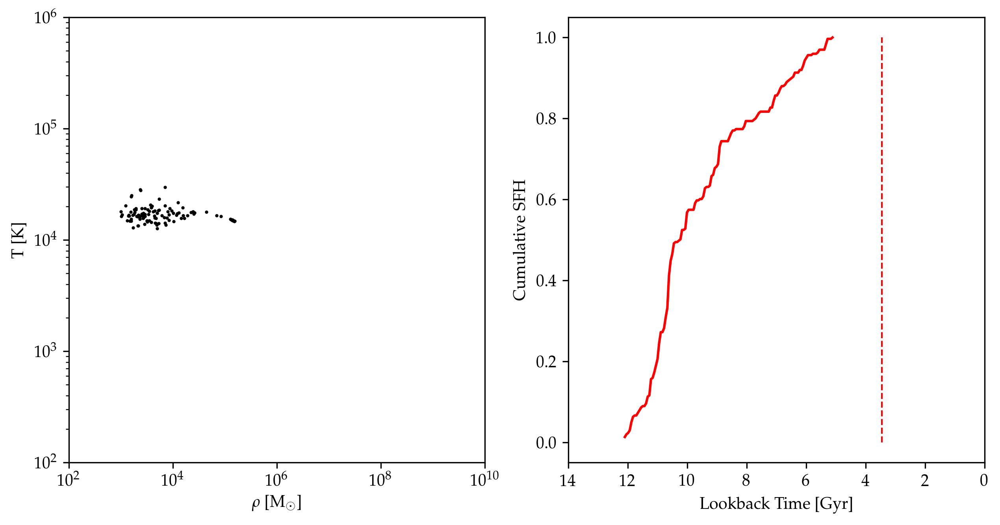

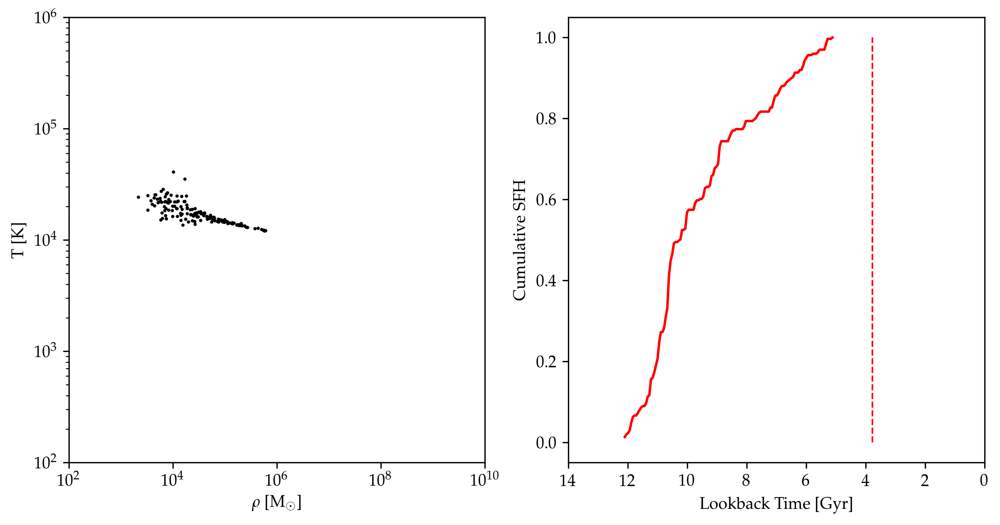

...

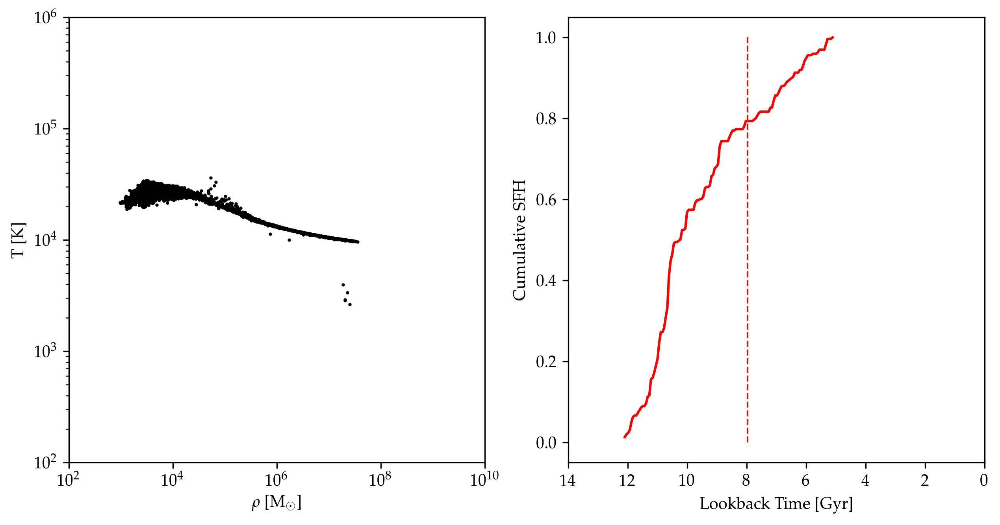

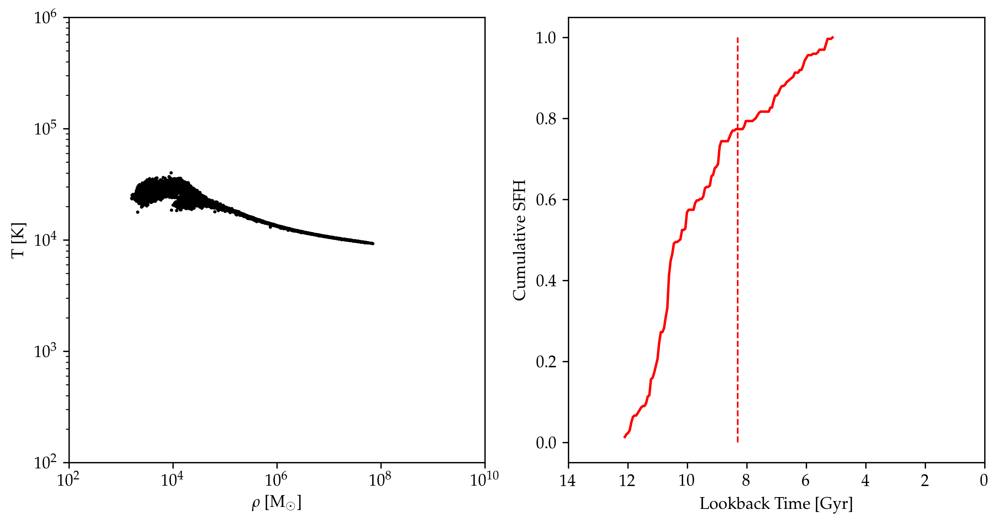

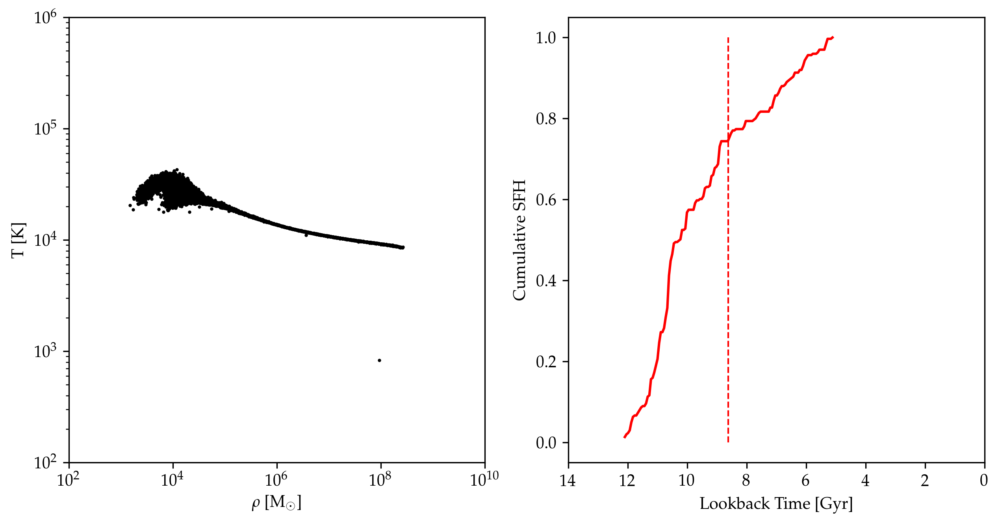

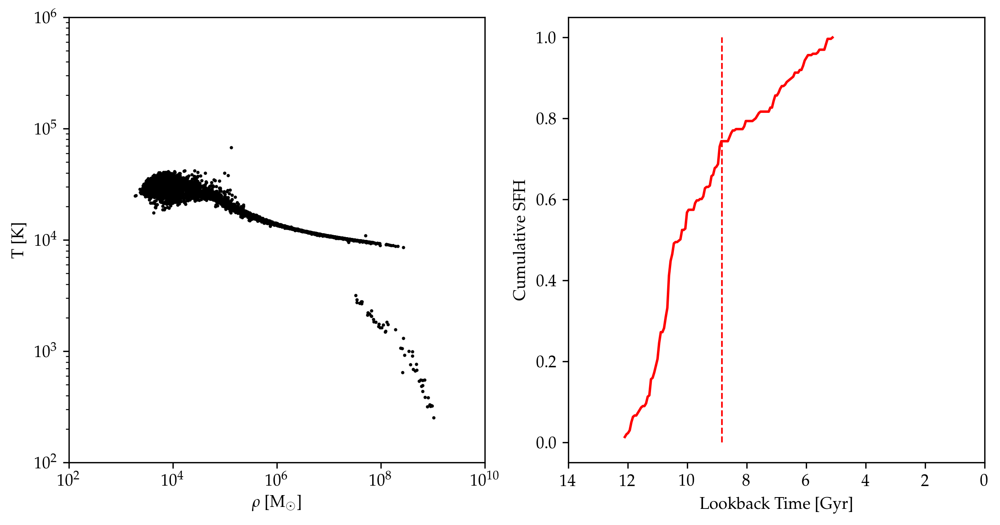

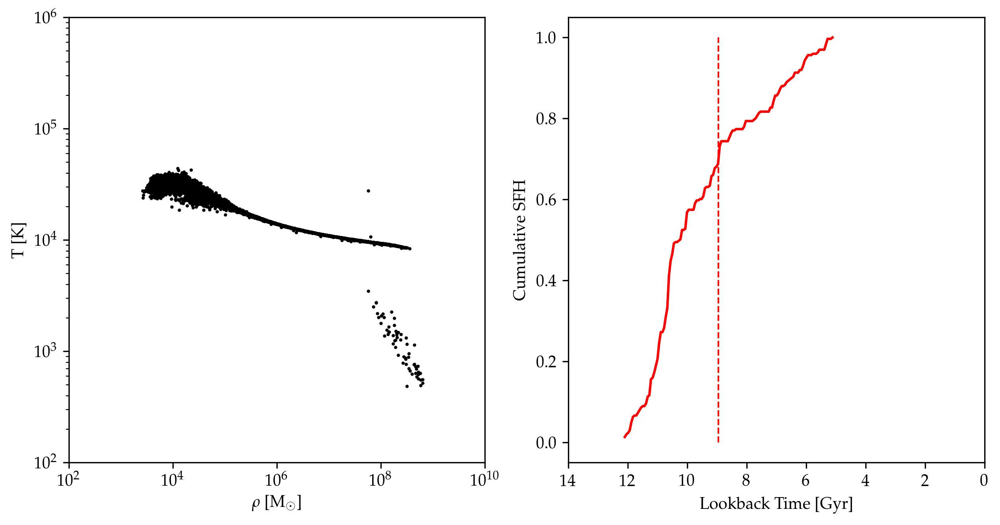

In [205]:

for i in range(10,35):
    rho = data.gas_rho.tolist()[i]
    temp = data.gas_temp.tolist()[i]
    #mass = data.gas_mass.tolist()[i]
    t = time[i]
    
    fig, ax = plt.subplots(1,2,figsize=(10,5),dpi=300)

    ax[0].scatter(rho,temp,s=1,c='k')
    ax[0].loglog()
    ax[0].set_xlabel(r'$\rho$ [$\mathrm{M}_{\odot}$]')
    ax[0].set_xlim(1e2,1e10)
    ax[0].set_ylim(1e2,1e6)
    ax[0].set_ylabel(r'T [K]')
    
    ax[1].plot(bc, c_sfh, 'r')
    ax[1].set_xlim(14,0)
    ax[1].set_ylim(-0.05,1.05)
    ax[1].set_xlabel('Lookback Time [Gyr]')
    ax[1].set_ylabel('Cumulative SFH')
    
    ax[1].plot([t,t],[0,1],'r--', linewidth=1)
    
    plt.savefig(f'h329_33_Movie/{i}.png', dpi=300)
    fig.show()

In [206]:
import imageio
import os

path = '/home/akinshol/Data/Timescales/h329_33_Movie/'

image_folder = os.fsencode(path)
filenames = []
for file in os.listdir(image_folder):
    filename = os.fsdecode(file)
    if filename.endswith('.png'):
        filenames.append(filename)
    
filenames.sort()
print(filenames)

images = list(map(lambda filename: imageio.imread(path+filename), filenames))

s = 30

imageio.mimsave('h329_33_movie.gif', images, duration = s/60)

['10.png', '11.png', '12.png', '13.png', '14.png', '15.png', '16.png', '17.png', '18.png', '19.png', '20.png', '21.png', '22.png', '23.png', '24.png', '25.png', '26.png', '27.png', '28.png', '29.png', '30.png', '31.png', '32.png', '33.png', '34.png']


In [163]:
from matplotlib.image import NonUniformImage

[3.15055501 3.70709395 4.26363288 4.82017181 5.37671074 5.93324967
 6.48978861 7.04632754 7.60286647 8.1594054  8.71594434] [2.78231775 3.00929854 3.23627934 3.46326013 3.69024092 3.91722171
 4.1442025  4.37118329 4.59816409 4.82514488 5.05212567]


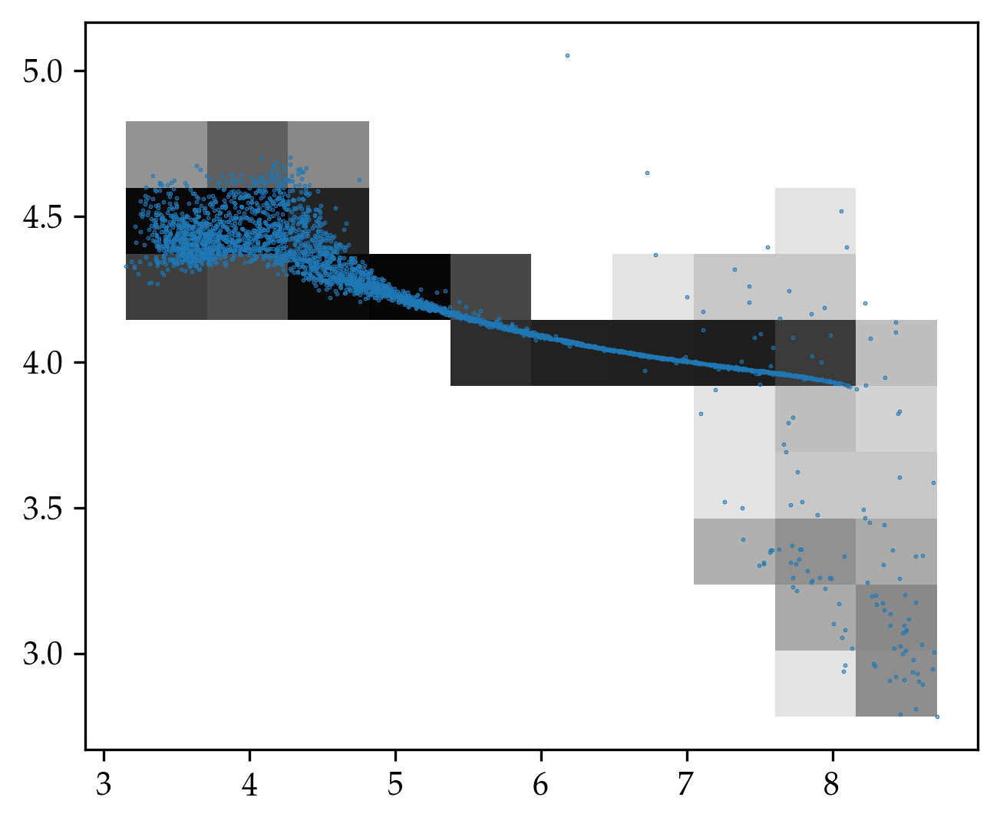

In [190]:
fig, ax = plt.subplots(1,1,figsize=(5,5),dpi=300)

x = np.log10(rho)
y = np.log10(temp)
xmin, xmax = x.min(), x.max()
ymin, ymax = y.min(), y.max()

out, xedges, yedges = np.histogram2d(x, y, bins=10)
print(xedges,yedges)
ax.imshow(out.T, origin='low', norm=mpl.colors.LogNorm(), cmap='gray_r', extent=[xmin,xmax,ymin,ymax], aspect=2)
ax.scatter(x,y,s=0.1)
# NonUniformImage(out)

# ax.loglog()
# ax.set_xlabel(r'$\rho$ [$\mathrm{M}_{\odot}$]')
# ax.set_ylabel(r'T [K]')

fig.show()

In [191]:
len(sims)

22

In [179]:
fig, ax = plt.subplots(1,1,figsize=(5,5),dpi=300)

out, xedges, yedges = np.histogram2d(np.log10(rho), np.log10(temp), bins=10)

im = NonUniformImage(ax, interpolation='bilinear')

xcenters = (xedges[:-1] + xedges[1:]) / 2
ycenters = (yedges[:-1] + yedges[1:]) / 2
im.set_data(xcenters, ycenters, out.T)

ax.images.append(im)
fig.show()

TypeError: cannot unpack non-iterable NoneType object

<Figure size 1500x1500 with 1 Axes>

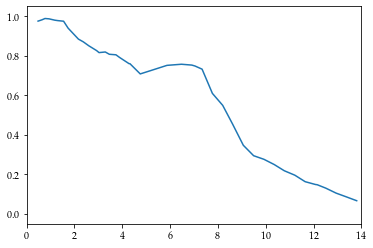

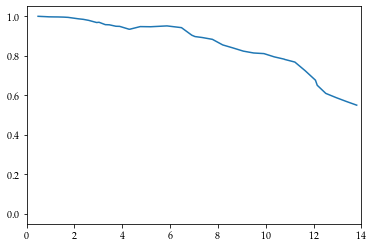

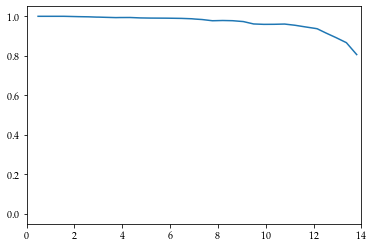

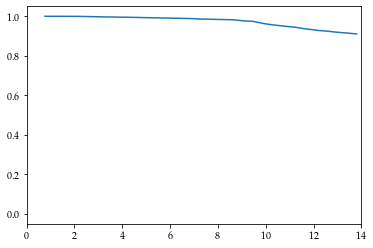

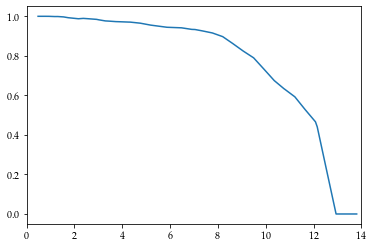

...

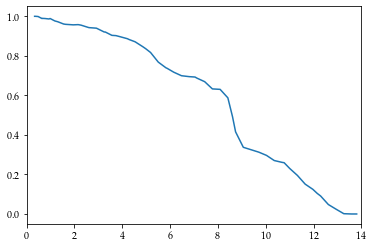

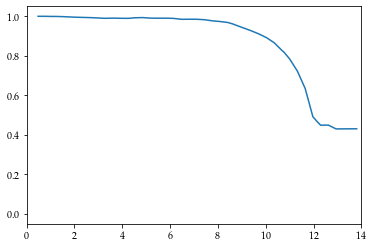

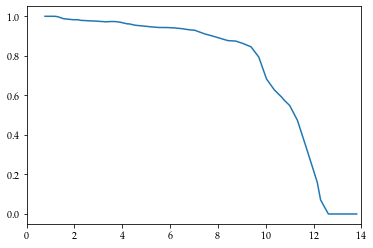

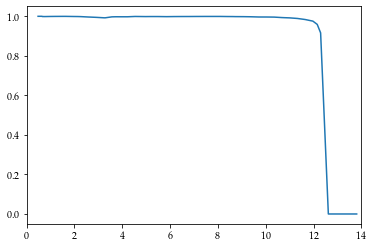

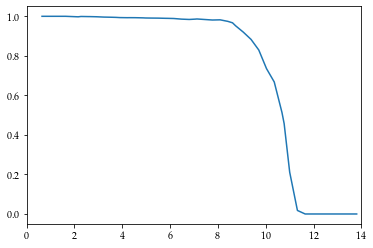

In [218]:
for sim, i in zip(sims,ids):
    data = read_file(sim,i)
    plt.figure()
    plt.plot(data.time, data.gasfrac)
    plt.ylim(-0.05,1.05)
    plt.xlim(0,14)
    plt.show()